In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
cd ./drive/MyDrive/NN/NN/

/content/drive/.shortcut-targets-by-id/1d4qlw5kzBmQEnE63I2YgGtBP9HGWZ6Ju/NN


In [1]:
ls

 Volume in drive C has no label.
 Volume Serial Number is 0A5B-539A

 Directory of C:\Users\Omar Bayoumi\Desktop\NN\NN

30/09/2021  23:25    <DIR>          .
30/09/2021  23:25    <DIR>          ..
28/09/2021  23:35    <DIR>          .ipynb_checkpoints
30/09/2021  23:25         7,559,706 Colorization.ipynb
30/09/2021  10:52    <DIR>          CrossEntropy_Model
28/09/2021  20:34    <DIR>          TEST
28/09/2021  20:34    <DIR>          TRAIN
28/09/2021  20:34    <DIR>          VALID
               1 File(s)      7,559,706 bytes
               7 Dir(s)  228,994,387,968 bytes free


#DA QUI

In [1]:
from PIL import Image
import numpy as np
from skimage import color
import torch
import torch.nn.functional as F
from IPython import embed
# import cv2
from matplotlib import pyplot as plt
import os, random
from zipfile import ZipFile
import shutil
from os import listdir
from os.path import isfile, join
import torch.optim as optim
from torch.utils.data import IterableDataset
import pickle 
from torch import nn
from sklearn.metrics import f1_score
from datetime import datetime
import scipy.sparse as sp
import json
import math
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module
from skimage.morphology import disk
from scipy.ndimage import gaussian_filter
from operator import itemgetter
# import datetime
import concurrent.futures

# ROUTINES

In [2]:
def balancing_array():
  frequencies =[0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
                0.0,       0.0,        0.0,        29478.0,    2.0,        0.0,         0.0,         0.0,         3517.0,      11591.0,    14263.0,   6694.0,    6768.0,    4906.0,
                1947.0,    2621.0,     6591.0,     4058.0,     910.0,      49.0,        0.0,         0.0,         204208.0,    1185223.0,  951169.0,  318407.0,  171375.0,  47153.0,
                23993.0,   21082.0,    13323.0,    10590.0,    31646.0,    129222.0,    0.0,         0.0,         0.0,         237111.0,   1430344.0, 3551779.0, 1938665.0, 732482.0,
                272719.0,  108148.0,   77607.0,    41954.0,    129078.0,   153740.0,    6913.0,      0.0,         0.0,         0.0,        0.0,       476929.0,  1938794.0, 5008916.0,
                6796123.0, 2514742.0,  976780.0,   332753.0,   217108.0,   546293.0,    429966.0,    136974.0,    0.0,         0.0,        0.0,       0.0,       4470.0,    865917.0,
                4036038.0, 14742383.0, 25234848.0, 15578649.0, 3131558.0,  1379403.0,   1994040.0,   1388334.0,   228313.0,    0.0,        0.0,       0.0,       0.0,       0.0,
                115380.0,  1136856.0,  4016682.0,  18828562.0, 77237385.0, 219170250.0, 132613590.0, 17049342.0,  5448375.0,   925197.0,   16997.0,   0.0,       0.0,       0.0,
                0.0,       0.0,        302629.0,   812889.0,   2176032.0,  8705712.0,   32072995.0,  267616353.0, 112518803.0, 15518080.0, 1993597.0, 109010.0,  0.0,       0.0,
                0.0,       0.0,        0.0,        0.0,        233272.0,   322734.0,    1827043.0,   6967429.0,   7924937.0,   4488878.0,  2398659.0, 940958.0,  125184.0,  0.0,
                0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         24975.0,     142261.0,    877927.0,    1535083.0,  832243.0,  427516.0,  250936.0,  64113.0,
                0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         32223.0,     85673.0,    295890.0,  181332.0,  141524.0,  48985.0,
                34398.0,   0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         10740.0,    47500.0,   19261.0,   11962.0,   1677.0,
                6.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         43064.0,    11708.0,   536.0,     0.0,       0.0,
                0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
                0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0]

  frequencies_not0 = []
  for i in frequencies:
    if (i != 0.0):
      frequencies_not0.append(i)
  distribution = frequencies_not0/np.array(frequencies_not0).sum()

  gaussian_distribution = gaussian_filter(distribution, 5)
  w = lambda p_tilde,l: 1/((1-l)*p_tilde + l/114)
  weighting_factor = w(gaussian_distribution, 0.5)
  weighting_factor = weighting_factor/np.dot(gaussian_distribution, weighting_factor)
  return torch.tensor(weighting_factor)

# Save model utility
def save_current_model(path, model, optimizer, epoch, loss, batch, training_losses, validation_losses, training_set, epoch_loss_list, model_type, report_description = ""):
  nome_file = model_type + "_" + str(batch) + "_" + str(epoch) + ".pt"
  report_file_path = path + "REPORT_" + model_type + ".txt"

  now = datetime.now()
  current_time = now.strftime("%H:%M:%S")

  with open(report_file_path,'a+') as report_file:      
    report_file.write("TIME " + current_time + " MODEL " + report_description + "\n")

  torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': loss,
    'batch' : batch,
    'training_losses' : training_losses,
    'validation_losses' : validation_losses, 
    'training_set' : training_set,
    'epoch_loss_list': epoch_loss_list
    }, os.path.join(path,nome_file.format(epoch)))
  
def load_img(img_path):
	out_np = np.asarray(Image.open(img_path))
	if(out_np.ndim==2):
		out_np = np.tile(out_np[:,:,None],3)
	return out_np

def resize_img(img, HW=(256,256), resample=3):
	return np.asarray(Image.fromarray(img).resize((HW[1],HW[0]), resample=resample))
  
def quantize_lab():
  lab_color_space = np.zeros((256, 256, 3))
  circle = disk(128)
  for i in range(256):
    for j in range(256):
      if (circle[i][j] == 1):
        lab_color_space[i][j] = [50, 128 - i,  128 - j]
  lab_color_space_RGB = color.lab2rgb(lab_color_space)

  classes_grid = np.zeros((16, 16, 3))

  for i in range(16):
    for j in range(16):
      c = 0
      for k in range(16):
        for m in range(16):
          if (lab_color_space_RGB[i*16 + k][j*16 +m][0] != 0 or lab_color_space_RGB[i*16 + k][j*16 +m][1] != 0 or lab_color_space_RGB[i*16 + k][j*16 +m][2] != 0):
            c += 1
          classes_grid[i][j][0] += lab_color_space_RGB[i*16 + k][j*16 + m][0]
          classes_grid[i][j][1] += lab_color_space_RGB[i*16 + k][j*16 + m][1]
          classes_grid[i][j][2] += lab_color_space_RGB[i*16 + k][j*16 + m][2]
      classes_grid[i][j][0] /= c
      classes_grid[i][j][1] /= c
      classes_grid[i][j][2] /= c

  class_counter = 0;
  classes = {}
  for i in range(16):
    for j in range(16):
      if (str(classes_grid[i][j][0]) != "nan"  or str(classes_grid[i][j][1]) != "nan" or str(classes_grid[i][j][2]) != "nan" ):
        classes[(i,j)] = (class_counter, classes_grid[i][j])
        class_counter +=1

  freq = [0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
          0.0,       0.0,        0.0,        29478.0,    2.0,        0.0,         0.0,         0.0,         3517.0,      11591.0,    14263.0,   6694.0,    6768.0,    4906.0,
          1947.0,    2621.0,     6591.0,     4058.0,     910.0,      49.0,        0.0,         0.0,         204208.0,    1185223.0,  951169.0,  318407.0,  171375.0,  47153.0,
          23993.0,   21082.0,    13323.0,    10590.0,    31646.0,    129222.0,    0.0,         0.0,         0.0,         237111.0,   1430344.0, 3551779.0, 1938665.0, 732482.0,
          272719.0,  108148.0,   77607.0,    41954.0,    129078.0,   153740.0,    6913.0,      0.0,         0.0,         0.0,        0.0,       476929.0,  1938794.0, 5008916.0,
          6796123.0, 2514742.0,  976780.0,   332753.0,   217108.0,   546293.0,    429966.0,    136974.0,    0.0,         0.0,        0.0,       0.0,       4470.0,    865917.0,
          4036038.0, 14742383.0, 25234848.0, 15578649.0, 3131558.0,  1379403.0,   1994040.0,   1388334.0,   228313.0,    0.0,        0.0,       0.0,       0.0,       0.0,
          115380.0,  1136856.0,  4016682.0,  18828562.0, 77237385.0, 219170250.0, 132613590.0, 17049342.0,  5448375.0,   925197.0,   16997.0,   0.0,       0.0,       0.0,
          0.0,       0.0,        302629.0,   812889.0,   2176032.0,  8705712.0,   32072995.0,  267616353.0, 112518803.0, 15518080.0, 1993597.0, 109010.0,  0.0,       0.0,
          0.0,       0.0,        0.0,        0.0,        233272.0,   322734.0,    1827043.0,   6967429.0,   7924937.0,   4488878.0,  2398659.0, 940958.0,  125184.0,  0.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         24975.0,     142261.0,    877927.0,    1535083.0,  832243.0,  427516.0,  250936.0,  64113.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         32223.0,     85673.0,    295890.0,  181332.0,  141524.0,  48985.0,
          34398.0,   0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         10740.0,    47500.0,   19261.0,   11962.0,   1677.0,
          6.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         43064.0,    11708.0,   536.0,     0.0,       0.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0]

  classes_not_0_freq = []
  for i in range(len(freq)):
    if (freq[i] != 0.0):
      classes_not_0_freq.append(i)
  skimming_index2classes = {}
  skimming_classes2rgb = {}
  class_count = 0
  for key, value in classes.items():
    if (value[0] in classes_not_0_freq):
      skimming_classes2rgb[class_count] = value[1]
      skimming_index2classes[(15-key[0])*16 + (15-key[1])] = class_count
      class_count += 1
      
  return skimming_index2classes, skimming_classes2rgb

def preprocess_img_regression(img_rgb_orig, HW=(256,256), resample=3):
	img_rgb_rs = resize_img(img_rgb_orig, HW=HW, resample=resample)
	
	img_lab_orig = color.rgb2lab(img_rgb_orig)
	img_lab_rs = color.rgb2lab(img_rgb_rs)
	img_l_orig = img_lab_orig[:,:,0]
	img_l_rs = img_lab_rs[:,:,0]
 
	img_ab_orig = img_lab_orig[:,:,1:3]
	labels = img_lab_rs[:,:,1:3]

	tens_orig_l = torch.Tensor(img_l_orig)[None,:,:]
	tens_orig_ab = torch.Tensor(img_ab_orig)[None,:,:]

	return (tens_orig_l, img_l_rs, tens_orig_ab, labels)

def preprocess_img_classification(img_rgb_orig, classes, HW=(256,256), resample=3):
  # return original size L and resized L as torch Tensors
  img_rgb_rs = resize_img(img_rgb_orig, HW=HW, resample=3)

  img_lab_orig = color.rgb2lab(img_rgb_orig)
  img_lab_rs = color.rgb2lab(img_rgb_rs)
  img_l_orig = img_lab_orig[:,:,0]
  img_l_rs = img_lab_rs[:,:,0]

  img_ab_orig = img_lab_orig[:,:,1:3]

  tens_orig_l = torch.Tensor(img_l_orig)[None,:,:]
  tens_orig_ab = torch.Tensor(img_ab_orig)[None,:,:]

  img_lab_for_grid = (img_lab_rs+128)//16
  img_lab_for_grid = (img_lab_for_grid[:,:,1]*16 + img_lab_for_grid[:,:,2]).astype(int)    
  labels = np.array(itemgetter(*img_lab_for_grid.flatten())(classes)).reshape((256,256))
  


  return (tens_orig_l, img_l_rs, tens_orig_ab, labels)

def pre_process_multi_thread(img_path, classification, index2classes):
    img = load_img(img_path)
    if (classification):
        (tens_orig_l, tens_rs_l, tens_orig_ab, labels) = preprocess_img_classification(img, index2classes)
    else:
        (tens_orig_l, tens_rs_l, tens_orig_ab, labels) = preprocess_img_regression(img)
    return (tens_orig_l, tens_rs_l, tens_orig_ab, labels)

def postprocess_tens(tens_orig_l, out_ab, mode='bilinear'):
  tens_orig_l = torch.Tensor(tens_orig_l)[None,:,:,:]
  HW_orig = tens_orig_l.shape[2:]
  HW = out_ab.shape[2:]

  if(HW_orig[0]!=HW[0] or HW_orig[1]!=HW[1]):
    out_ab_orig = F.interpolate(out_ab, size=HW_orig, mode='bilinear')
  else:
    out_ab_orig = out_ab

  out_lab_orig = torch.cat((tens_orig_l, out_ab_orig), dim=1)
  print(out_lab_orig.shape)
  return color.lab2rgb(out_lab_orig.data.cpu().numpy()[0,...].transpose((1,2,0)))


# Model class

In [3]:
#  Neural Network class
class ColorizationModel(nn.Module):
    def __init__(self, classification):

        super(ColorizationModel, self).__init__()

        self.l_cent = 50.
        self.l_norm = 100.
        self.ab_norm = 110.
        self.classification = classification

        self.normalization_layer = nn.BatchNorm2d

        self.model_1_Conv2D_1 = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_1_Relu_1 = nn.ReLU(True)
        self.model_1_Conv2D_2 = nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1, bias=True)
        self.model_1_Relu_2 = nn.ReLU(True)
        self.model_1_norm_layer = self.normalization_layer(64)

        self.model_2_Conv2D_1 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_2_Relu_1 = nn.ReLU(True)
        self.model_2_Conv2D_2 = nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1, bias=True)
        self.model_2_Relu_2 = nn.ReLU(True)
        self.model_2_norm_layer = self.normalization_layer(128)

        self.model_3_Conv2D_1 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_3_Relu_1 = nn.ReLU(True)
        self.model_3_Conv2D_2 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_3_Relu_2 = nn.ReLU(True)
        self.model_3_Conv2D_3 = nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1, bias=True)
        self.model_3_Relu_3 = nn.ReLU(True)
        self.model_3_norm_layer = self.normalization_layer(256)

        self.model_4_Conv2D_1 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_4_Relu_1 = nn.ReLU(True)
        self.model_4_Conv2D_2 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_4_Relu_2 = nn.ReLU(True)
        self.model_4_Conv2D_3 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_4_Relu_3 = nn.ReLU(True)
        self.model_4_norm_layer = self.normalization_layer(512)

        self.model_5_Conv2D_1 = nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True)
        self.model_5_Relu_1 = nn.ReLU(True)
        self.model_5_Conv2D_2 = nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True)
        self.model_5_Relu_2 = nn.ReLU(True)
        self.model_5_Conv2D_3 = nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True)
        self.model_5_Relu_3 = nn.ReLU(True)
        self.model_5_norm_layer = self.normalization_layer(512)

        self.model_6_Conv2D_1 = nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True)
        self.model_6_Relu_1 = nn.ReLU(True)
        self.model_6_Conv2D_2 = nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True)
        self.model_6_Relu_2 = nn.ReLU(True)
        self.model_6_Conv2D_3 = nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True)
        self.model_6_Relu_3 = nn.ReLU(True)
        self.model_6_norm_layer = self.normalization_layer(512)

        self.model_7_Conv2D_1 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_7_Relu_1 = nn.ReLU(True)
        self.model_7_Conv2D_2 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_7_Relu_2 = nn.ReLU(True)
        self.model_7_Conv2D_3 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_7_Relu_3  = nn.ReLU(True)
        self.model_7_norm_layer = self.normalization_layer(512)

        self.model_8_Conv2D_1 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=True)
        self.model_8_Relu_1 = nn.ReLU(True)
        self.model_8_Conv2D_2 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_8_Relu_2 = nn.ReLU(True)
        self.model_8_Conv2D_3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True)
        self.model_8_Relu_3  = nn.ReLU(True)
        self.model_8_Conv2D_4 = nn.Conv2d(256, 114, kernel_size=1, stride=1, padding=0, bias=True)

        if(not self.classification):
          self.softmax = nn.Softmax(dim=1)
          self.model_out_reg = nn.Conv2d(114, 2, kernel_size=1, padding=0, dilation=1, stride=1, bias=False)

        self.upsample4 = nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False)

    def normalize_l(self, in_l):
      return (in_l-self.l_cent)/self.l_norm

    def unnormalize_l(self, in_l):
      return in_l*self.l_norm + self.l_cent

    def normalize_ab(self, in_ab):
      return in_ab/self.ab_norm

    def unnormalize_ab(self, in_ab):
      return in_ab*self.ab_norm

    def forward(self, input_l):
        out = self.model_1_Conv2D_1(self.normalize_l(input_l))
        out = self.model_1_Relu_1(out)
        out = self.model_1_Conv2D_2(out)
        out = self.model_1_Relu_2(out)
        out = self.model_1_norm_layer(out)

        out = self.model_2_Conv2D_1(out)
        out = self.model_2_Relu_1(out)
        out = self.model_2_Conv2D_2(out)
        out = self.model_2_Relu_2(out)
        out = self.model_2_norm_layer(out)
        
        out = self.model_3_Conv2D_1(out)
        out = self.model_3_Relu_1(out)
        out = self.model_3_Conv2D_2(out)
        out = self.model_3_Relu_2(out)
        out = self.model_3_Conv2D_3(out)
        out = self.model_3_Relu_3(out)
        out = self.model_3_norm_layer(out)
        
        out = self.model_4_Conv2D_1(out)
        out = self.model_4_Relu_1(out)
        out = self.model_4_Conv2D_2(out)
        out = self.model_4_Relu_2(out)
        out = self.model_4_Conv2D_3(out)
        out = self.model_4_Relu_3(out)
        out = self.model_4_norm_layer(out)

        out = self.model_5_Conv2D_1(out)
        out = self.model_5_Relu_1(out)
        out = self.model_5_Conv2D_2(out)
        out = self.model_5_Relu_2(out)
        out = self.model_5_Conv2D_3(out)
        out = self.model_5_Relu_3(out)
        out = self.model_5_norm_layer(out)

        out = self.model_6_Conv2D_1(out)
        out = self.model_6_Relu_1(out)
        out = self.model_6_Conv2D_2(out)
        out = self.model_6_Relu_2(out)
        out = self.model_6_Conv2D_3(out)
        out = self.model_6_Relu_3(out)
        out = self.model_6_norm_layer(out)

        out = self.model_7_Conv2D_1(out)
        out = self.model_7_Relu_1(out)
        out = self.model_7_Conv2D_2(out)
        out = self.model_7_Relu_2(out)
        out = self.model_7_Conv2D_3(out)
        out = self.model_7_Relu_3(out)
        out = self.model_7_norm_layer(out)

        out = self.model_8_Conv2D_1(out)
        out = self.model_8_Relu_1(out)
        out = self.model_8_Conv2D_2(out)
        out = self.model_8_Relu_2(out)
        out = self.model_8_Conv2D_3(out)
        out = self.model_8_Relu_3(out)
        out = self.model_8_Conv2D_4(out)
        if (not self.classification):
          out = self.softmax(out)
          out_reg = self.model_out_reg(out)
          return self.unnormalize_ab(self.upsample4(out_reg))
        else:
          return self.unnormalize_ab(self.upsample4(out)) #unnormalize_ab??????

In [4]:
class Dataset():

  def __init__(self, batch_size, filepath, gpu, classification):
    self.batch_number = 0
    self.batch_size = batch_size
    self.filepath = filepath
    self.dataset_list = [f for f in listdir(self.filepath) if isfile(join(self.filepath, f))]
    ind2cl, cl2rgb = quantize_lab()
    self.index2classes = ind2cl
    self.classes2rgb = cl2rgb
    self.gpu = gpu
    self.classification = classification
    print(filepath[2:-1] + " dataset list length:",len(self.dataset_list))
    
  def shuffle_dataset(self):
    random.shuffle(self.dataset_list)

  def get_batch(self, batch_number):
    self.batch_number=batch_number
    if ((self.batch_number*self.batch_size) >= len(self.dataset_list)):
      return None

    if (((self.batch_number)*self.batch_size + self.batch_size) >= len(self.dataset_list)):
      image_to_load = [self.filepath + x for x in self.dataset_list[(self.batch_number*self.batch_size):]]
    else:
      image_to_load = [self.filepath + x for x in self.dataset_list[(self.batch_number*self.batch_size):((self.batch_number)*self.batch_size  + self.batch_size)]]
    
    
    with concurrent.futures.ThreadPoolExecutor() as executor:
      pre_processes = executor.map(pre_process_multi_thread, image_to_load, 
                                [self.classification for i in range(len(image_to_load))],
                                [self.index2classes for i in range(len(image_to_load))])
    batch_orig_l = []
    batch_rs_l = []
    batch_orig_ab = []
    batch_labels = []
    for pre_process in pre_processes:
      (tens_orig_l, tens_rs_l, tens_orig_ab, labels) = pre_process
      tens_rs_l = np.array([tens_rs_l])
      batch_orig_l.append(tens_orig_l)
      batch_rs_l.append(tens_rs_l)

      labels = np.array([labels])
      batch_orig_ab.append(tens_orig_ab)
      batch_labels.append(labels)
    batch_rs_l = torch.Tensor(batch_rs_l)
    batch_labels = torch.Tensor(batch_labels)

    if (self.gpu):
      batch_rs_l = batch_rs_l.to("cuda")
      batch_labels = batch_labels.to("cuda")

    batch = {"original_l": batch_orig_l, "resized_l": batch_rs_l, "original_ab": batch_orig_ab, "labels": batch_labels}
    return batch

In [5]:
class Colorization():
  
  def __init__(self, save_path, model_name = "", classification = True, batch_size = 20, checkpoint_path = None, epochs = 200):
    self.batch_size = batch_size
    self.batch_index = 0

    self.epochs = epochs
    self.epoch_index = 0
    self.epoch_loss_list = []

    self.gpu = torch.cuda.is_available()
    self.classification = classification

    self.training_set = Dataset(self.batch_size, "./TRAIN/", self.gpu, self.classification)
    self.validation_set = Dataset(self.batch_size, "./VALID/", self.gpu, self.classification)
    self.test_set = Dataset(self.batch_size, "./TEST/", self.gpu, self.classification)

    self.training_losses = []
    self.validation_losses = []
    if (self.classification):
      self.validation_loss_function = nn.CrossEntropyLoss()
      bal_arr = balancing_array().type(torch.FloatTensor)
      if (self.gpu):
        bal_arr = bal_arr.to("cuda")
      self.loss_function = nn.CrossEntropyLoss(weight=bal_arr)
    else:
      loss_function = nn.MSELoss()

    self.model = ColorizationModel(self.classification)
    if (self.gpu):
      self.model.to("cuda")

    self.optimizer = optim.Adam(self.model.parameters(), lr=0.00003, weight_decay=0.001)
      
    self.save_path = save_path
    self.model_name = model_name

    if (checkpoint_path != None):
      checkpoint_folder = checkpoint_path[:-len(checkpoint_path.split("/")[-1])]
      checkpoint_name = checkpoint_path.split("/")[-1]
      if (self.gpu):
        checkpoint = torch.load(os.path.join(checkpoint_folder,checkpoint_name))
      else:
        checkpoint = torch.load(os.path.join(checkpoint_folder,checkpoint_name),map_location=torch.device('cpu'))
      self.model.load_state_dict(checkpoint['model_state_dict'])
      self.optimizer.load_state_dict(checkpoint['optimizer_state_dict']) #serve?????? è sempre lo stesso!
      self.epoch_index = checkpoint['epoch']
      self.loss_function = checkpoint['loss']
      self.batch_index = checkpoint['batch']
      self.training_losses = checkpoint['training_losses']
      self.validation_losses = checkpoint['validation_losses']
      self.training_set = checkpoint['training_set']
      self.epoch_loss_list = checkpoint['epoch_loss_list']
  
  def train(self):
    for epoch in range(self.epoch_index, self.epochs, 1):
      if (self.batch_index == 0):
        self.training_set.shuffle_dataset()
        self.epoch_loss_list = []
      print("EPOCH " + str(epoch))
      print("\tTrain")
      print("\r\t\tBatch " + str(self.batch_index) + "/" + str(len(self.training_set.dataset_list)//self.batch_size) + " |" + "-"*50 + "| 0%", end = '')
      while (True):
        torch.cuda.empty_cache()
        
        self.model.train()
        torch.cuda.empty_cache()

        self.optimizer.zero_grad()
        torch.cuda.empty_cache()
        print("\r" + " "*150, end='')
        print("\r\t\tBatch " + str(self.batch_index) + "/" + str(len(self.training_set.dataset_list)//self.batch_size) + 
              " |" + "="*(self.batch_index//((len(self.training_set.dataset_list)//self.batch_size)//50)) + 
              "-"*(50-(self.batch_index//((len(self.training_set.dataset_list)//self.batch_size)//50))) + "| " + 
              str((self.batch_index/(len(self.training_set.dataset_list)//self.batch_size))*100) + "%", end = '')
        tens_input = self.training_set.get_batch(self.batch_index)
        torch.cuda.empty_cache()

        if (tens_input == None):
          print("\r" + " "*150, end='')
          print("\r\t\tBatch " + str(len(self.training_set.dataset_list)//self.batch_size) + "/" + str(len(self.training_set.dataset_list)//self.batch_size) + " |" + "="*50 + "| 100%", end = '')
          print("")
          break

        predicted_ab = self.model(tens_input['resized_l'])
        torch.cuda.empty_cache()
        
        if (self.classification):
          resized_gt = tens_input['labels'].type(torch.LongTensor).squeeze(1)
        else:
          resized_gt = tens_input['labels'].reshape(predicted_ab.shape).type(torch.LongTensor)
        if (self.gpu):
          resized_gt = resized_gt.to("cuda")
        torch.cuda.empty_cache()

        sample_loss = self.loss_function(predicted_ab, resized_gt)
        torch.cuda.empty_cache()

        del tens_input
        del predicted_ab
        del resized_gt

        sample_loss.backward()
        torch.cuda.empty_cache()

        self.optimizer.step()
        torch.cuda.empty_cache()
        
        self.epoch_loss_list.append(sample_loss.item())
        torch.cuda.empty_cache()

        if (self.batch_index%200 == 0):
          save_current_model(self.save_path, self.model, self.optimizer, epoch, self.loss_function,
                             self.batch_index, self.training_losses, self.validation_losses, self.training_set,  self.epoch_loss_list,
                             self.model_name, report_description = "partial loss mean: " + str(sum(self.epoch_loss_list) / len(self.epoch_loss_list))) 
        self.batch_index += 1 

      self.batch_index = 0
      epoch_loss_mean = sum(self.epoch_loss_list) / len(self.epoch_loss_list)
      self.training_losses.append(epoch_loss_mean)

      print("\tThe average of the loss of the training in epoch " + str(epoch) + " is: " + str(epoch_loss_mean))

      valid_loss_mean = self.validation()
      print("\tThe average of the loss of the validation in epoch " + str(epoch) + " is: " + str(valid_loss_mean)) 

      self.validation_losses.append(valid_loss_mean)

      save_current_model(self.save_path, self.model, self.optimizer, epoch + 1, self.loss_function, 
                                  self.batch_index, self.training_losses, self.validation_losses, self.training_set, self.epoch_loss_list,
                                  self.model_name, report_description = "epoch " + str(epoch) + " training_loss_mean: " + str(epoch_loss_mean) +  "; valid_loss_mean: " +  str(valid_loss_mean))
    print("END of", self.epochs, "epochs")
    print("Training loss list: \n\t", self.training_losses)
    print("Validation loss list: \n\t", self.validation_losses)
    return (self.training_losses, self.validation_losses)

  def validation(self):
    validation_batch_index = 0
    valid_loss = 0.0
    self.model.eval()
    
    print("\tValidation")
    print("\r\t\tBatch " + str(validation_batch_index) + "/" + str(len(self.validation_set.dataset_list)//self.batch_size) + " |" + "-"*50 + "| 0%", end = '')
    with torch.no_grad():
      while (True):
        torch.cuda.empty_cache()
                  
        print("\r" + " "*150, end='')
        print("\r\t\tBatch " + str(validation_batch_index) + "/" + str(len(self.validation_set.dataset_list)//self.batch_size) + 
              " |" + "="*(validation_batch_index//((len(self.validation_set.dataset_list)//self.batch_size)//50)) + 
              "-"*(50-(validation_batch_index//((len(self.validation_set.dataset_list)//self.batch_size)//50))) + "| " + 
              str((validation_batch_index/(len(self.validation_set.dataset_list)//self.batch_size))*100) + "%", end = '')
        tens_input = self.validation_set.get_batch(validation_batch_index)
        torch.cuda.empty_cache()
        
        if (tens_input == None):
          print("\r" + " "*150, end='')
          print("\r\t\tBatch " + str(len(self.validation_set.dataset_list)//self.batch_size) + "/" + str(len(self.validation_set.dataset_list)//self.batch_size) + " |" + "="*50 + "| 100%", end = '')
          print("")
          break
        validation_batch_index += 1 

        predicted_ab = self.model(tens_input['resized_l'])
        torch.cuda.empty_cache()

        if (self.classification):
          resized_gt = tens_input['labels'].type(torch.LongTensor).squeeze(1)
        else:
          resized_gt = tens_input['labels'].reshape(predicted_ab.shape).type(torch.LongTensor)
        if (self.gpu):
          resized_gt = resized_gt.to("cuda")
        torch.cuda.empty_cache()

        sample_loss = self.validation_loss_function(predicted_ab, resized_gt)
        torch.cuda.empty_cache()

        del tens_input
        del predicted_ab
        del resized_gt

        valid_loss += sample_loss.tolist()
        torch.cuda.empty_cache()
    return valid_loss / validation_batch_index

  def test(self):
    print("TO DO")
    
  def experiment(dataset = "TEST"):
    if (dataset == "TEST"):
        random.randint(0, )
        
    elif (dataset == "TRAIN"):
        
    elif (dataset == "VALIDATION"):
    training_set.shuffle_dataset()
    img = load_img("./TRAIN/" + training_set.dataset_list[0])
    q, qq = quantize_lab()
    (tens_orig_l, img_l_rs, tens_orig_ab, img_ab_rs) = preprocess_img_classification(img, q)
    input = torch.tensor(img_l_rs)[None,None,:,:].type(torch.FloatTensor).to("cuda")
    model.to("cuda")
    predicted_ab = model(input)


    pr1 = predicted_ab[0].cpu().detach().numpy()
    pr2 = pr1 + np.abs(pr1.min())
    pr3 = (pr2/pr2.sum(0)) + 0.00000001

    T = [1., .77, .58, .38, .29, .14]
    b2_L = []
    cont = 1
    for t in T:
        b2 = np.exp(np.log(pr3)/t)
        b2_o = (b2/b2.sum(0)).round(7)
        b2_L.append(b2_o)
        print("\r" + str(t),end='')
    print("")

    cont = 1
    plt.figure(figsize=(6.4*3, 4.8*3), constrained_layout=False)
    for b in b2_L:
        print("\r" + str(cont),end='')
        ccc = np.dot(np.swapaxes(np.swapaxes(b, 0, 1), 1, 2) , np.array(list(qq.values())))
        asdfa = color.rgb2lab(ccc)
        asdfa[:,:,0] = img_l_rs
        plt.subplot(2, 4, cont), plt.imshow(color.lab2rgb(asdfa)), plt.title("T = " + str(T[cont-1]))
        cont += 1
    plt.subplot(2,4,7), plt.imshow(testing("./TRAIN/" + training_set.dataset_list[0], model)), plt.title(label = "T -> 0")

In [6]:
colorization = Colorization("./CrossEntropy_Model/Test8/", 
                            model_name="CEBwC8",
                            checkpoint_path = "./CrossEntropy_Model/Test8/CEBwC8_0_47.pt")

C:\Users\Omar Bayoumi\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1151 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2562332920.py:84: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2562332920.py:85: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2562332920.py:86: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c


TRAIN dataset list length: 16000
VALID dataset list length: 3000


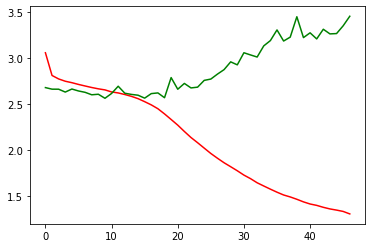

In [7]:
plt.plot(np.linspace(0,len(colorization.training_losses)-1, 
                   len(colorization.training_losses)), 
         colorization.training_losses, c ="red")
plt.plot(np.linspace(0,len(colorization.validation_losses)-1, 
                   len(colorization.validation_losses)), 
         colorization.validation_losses, c ="green")

In [19]:
colorization.train()

EPOCH 47
	Train
		Batch 1/800 |--------------------------------------------------| 0.125%                                                                             

KeyboardInterrupt: 

In [ ]:
colorization.test()

In [ ]:
colorization.experiment()

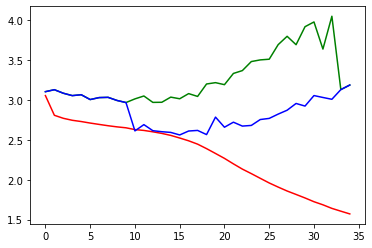

In [131]:
valplot = []
valplot += colorization.validation_losses[:10]
valplot += losval[:-1]
valplot += colorization.validation_losses[33:]

plt.plot(np.linspace(0,len(colorization.training_losses)-1, 
                   len(colorization.training_losses)), 
         colorization.training_losses, c ="red")
plt.plot(np.linspace(0,len(colorization.validation_losses)-1, 
                   len(colorization.validation_losses)), 
         colorization.validation_losses, c ="green")
plt.plot(np.linspace(0,len(valplot)-1, 
                   len(valplot)), 
         valplot, c ="blue")

In [124]:
freqt = [0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
          0.0,       0.0,        0.0,        29478.0,    2.0,        0.0,         0.0,         0.0,         3517.0,      11591.0,    14263.0,   6694.0,    6768.0,    4906.0,
          1947.0,    2621.0,     6591.0,     4058.0,     910.0,      49.0,        0.0,         0.0,         204208.0,    1185223.0,  951169.0,  318407.0,  171375.0,  47153.0,
          23993.0,   21082.0,    13323.0,    10590.0,    31646.0,    129222.0,    0.0,         0.0,         0.0,         237111.0,   1430344.0, 3551779.0, 1938665.0, 732482.0,
          272719.0,  108148.0,   77607.0,    41954.0,    129078.0,   153740.0,    6913.0,      0.0,         0.0,         0.0,        0.0,       476929.0,  1938794.0, 5008916.0,
          6796123.0, 2514742.0,  976780.0,   332753.0,   217108.0,   546293.0,    429966.0,    136974.0,    0.0,         0.0,        0.0,       0.0,       4470.0,    865917.0,
          4036038.0, 14742383.0, 25234848.0, 15578649.0, 3131558.0,  1379403.0,   1994040.0,   1388334.0,   228313.0,    0.0,        0.0,       0.0,       0.0,       0.0,
          115380.0,  1136856.0,  4016682.0,  18828562.0, 77237385.0, 219170250.0, 132613590.0, 17049342.0,  5448375.0,   925197.0,   16997.0,   0.0,       0.0,       0.0,
          0.0,       0.0,        302629.0,   812889.0,   2176032.0,  8705712.0,   32072995.0,  267616353.0, 112518803.0, 15518080.0, 1993597.0, 109010.0,  0.0,       0.0,
          0.0,       0.0,        0.0,        0.0,        233272.0,   322734.0,    1827043.0,   6967429.0,   7924937.0,   4488878.0,  2398659.0, 940958.0,  125184.0,  0.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         24975.0,     142261.0,    877927.0,    1535083.0,  832243.0,  427516.0,  250936.0,  64113.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         32223.0,     85673.0,    295890.0,  181332.0,  141524.0,  48985.0,
          34398.0,   0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         10740.0,    47500.0,   19261.0,   11962.0,   1677.0,
          6.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         43064.0,    11708.0,   536.0,     0.0,       0.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
          0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0]
freqv = [      0,         0,         0,         0,         0,         0,
               0,         0,         0,         0,         0,         0,
               0,         0,         0,         0,         0,         0,
               0,         0,         0,         0,         0,         0,
               0,         0,         0,        43,         0,         0,
               0,         0,         0,         0,         0,      5181,
            1149,      1807,      2513,      3904,      8502,      5543,
             532,      1882,       387,         8,         2,         0,
               0,         0,         0,    181275,   1258477,    464216,
          171037,    115745,     85477,     10852,      8562,     19802,
            9455,     21209,     14454,         0,         0,         0,
               0,    248255,   1896865,   2017730,    807660,    356964,
          110022,     62208,     44865,     26047,     64054,     97182,
             822,         0,         0,         0,         0,    521256,
         1418497,   3209181,   3085894,   1449133,    516887,    219430,
          127443,    226070,    161882,    119536,         0,         0,
               0,         0,     20706,    916402,   2440315,   7207835,
        11452710,   7435674,   1860805,    998235,   1113410,    597888,
          247858,         0,         0,         0,         0,         0,
          174573,    765624,   2555245,  11123123,  40517680, 100050145,
        64396040,   9010315,   3700586,    639159,     27530,         0,
               0,         0,         0,         0,    183253,    818667,
         2173189,   8089573,  27915786, 129933571,  45557904,   9431072,
         1992605,     48340,         0,         0,         0,         0,
               0,         0,    127379,    437252,   2791284,   9801922,
        11836588,   5396931,   1936541,   1042497,    126600,         0,
               0,         0,         0,         0,         0,         0,
           21899,    385976,   2186643,   2204178,    772797,    363089,
          297080,    111471,         0,         0,         0,         0,
               0,         0,         0,         0,      5355,     81691,
          361419,    162270,     85289,     86654,     29280,         0,
               0,         0,         0,         0,         0,         0,
               0,         0,       375,     21538,     20189,      1287,
             294,         0,         0,         0,         0,         0,
               0,         0,         0,         0,         0,         0,
              82,       149,        30,         0,         0,         0,
               0,         0,         0,         0,         0,         0,
               0,         0]

#TEST MODEL EXPERIMENTAL

In [6]:
BATCH_SIZE = 20
training_set = Dataset(BATCH_SIZE, "./TRAIN/", classification=True, gpu = False)
validation_set = Dataset(BATCH_SIZE, "./VALID/", classification=True, gpu = False)
test_set = Dataset(BATCH_SIZE, "./TEST/", classification=True, gpu = False)

C:\Users\Omar Bayoumi\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1151 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_9060/2562332920.py:84: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_9060/2562332920.py:85: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_9060/2562332920.py:86: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c


TRAIN dataset list length: 16000
VALID dataset list length: 3000
TEST dataset list length: 3000


In [13]:
def testing(img_path, model):
    img = load_img(img_path)
    (tens_orig_l, img_l_rs, tens_orig_ab, img_ab_rs) = preprocess_img_classification(img, q)
    input = torch.tensor(img_l_rs)[None,None,:,:].type(torch.FloatTensor).to("cuda")
    model.to("cuda")
    predicted_ab = model(input)
    pr_c = predicted_ab.cpu()[0].argmax(0).flatten().numpy().astype(int)
    out_rgb_l50 = np.array(itemgetter(*pr_c)(qq)).reshape(256,256,3)
    out_lab_l50 = color.rgb2lab(out_rgb_l50)
    out_lab_l50[:,:,0] = img_l_rs
    out_rgb = color.lab2rgb(out_lab_l50)
    return out_rgb.reshape((256,256,3))



In [238]:
q,qq = quantize_lab()
training_set.shuffle_dataset()
validation_set.shuffle_dataset()
test_set.shuffle_dataset()
n = 5
n_model = 14
out = []
models = []

imgs =  ["./TRAIN/" + x for x in training_set.dataset_list[:n]]
imgs += ["./VALID/" + x for x in validation_set.dataset_list[:n]]
imgs += ["./TEST/7661.JPEG"] +  ["./TEST/" + x for x in test_set.dataset_list[:n]]
# for i in range(10, 10 + n_model, 1):
#     checkpoint = torch.load(os.path.join("./CrossEntropy_Model/Test8/","CEBwC8_0_" + str(i) + ".pt"),map_location=torch.device('cpu'))
#     model = ColorizationModel(classification=True)
#     model.load_state_dict(checkpoint['model_state_dict'])
#     models += [model]

checkpoint = torch.load(os.path.join("./CrossEntropy_Model/Test8/","CEBwC8_0_46.pt"),map_location=torch.device('cpu'))
model = ColorizationModel(classification=True)
model.load_state_dict(checkpoint['model_state_dict'])
models = [model]
      
for i in range(len(models)):
    for j in range(len(imgs)):
        out.append(testing(imgs[j], models[i]))
    
# with concurrent.futures.ThreadPoolExecutor() as executor:
#     testing_imgs = executor.map(testing, imgs, models)
# out += [testing_imgs]

# plt.subplot(1,2,1), plt.imshow(out)

C:\Users\Omar Bayoumi\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1151 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2562332920.py:84: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2562332920.py:85: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2562332920.py:86: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c
C:\Users\Omar Bayoumi\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
C:\Users\Omar Bayoumi\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 82 pix

In [197]:
modeln = 0

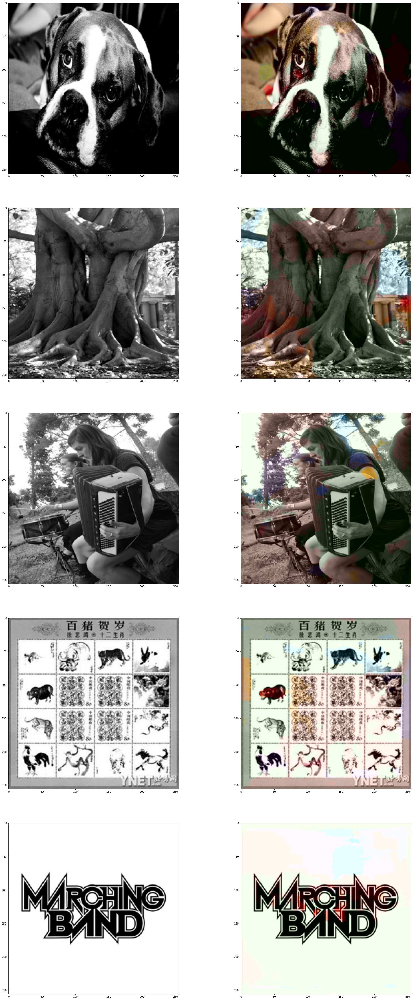

In [198]:
plt.figure(figsize=(6.4*15, 4.8*15), constrained_layout=False)
for i in range(n):
    imgtr = load_img(imgs[i])
    imgv = load_img(imgs[i+n])
    imgte = load_img(imgs[i+(2*n)])
#     plt.subplot(n,6,((i+1)*6)-5), plt.imshow(resize_img(imgtr))
#     plt.subplot(n,6,((i+1)*6)-4), plt.imshow(out[i + (modeln*15)])
#     plt.subplot(n,6,((i+1)*6)-3), plt.imshow(resize_img(imgv))
#     plt.subplot(n,6,((i+1)*6)-2), plt.imshow(out[i + n + (modeln*15)])
    plt.subplot(n,6,((i+1)*6)-1), plt.imshow(resize_img(imgte))
    plt.subplot(n,6,((i+1)*6)), plt.imshow(out[i + (2*n) + (modeln*15)])

C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_9060/2562332920.py:84: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_9060/2562332920.py:85: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_9060/2562332920.py:86: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c


0.14
6

(<AxesSubplot:title={'center':'T -> 0'}>,
 Text(0.5, 1.0, 'T -> 0'))

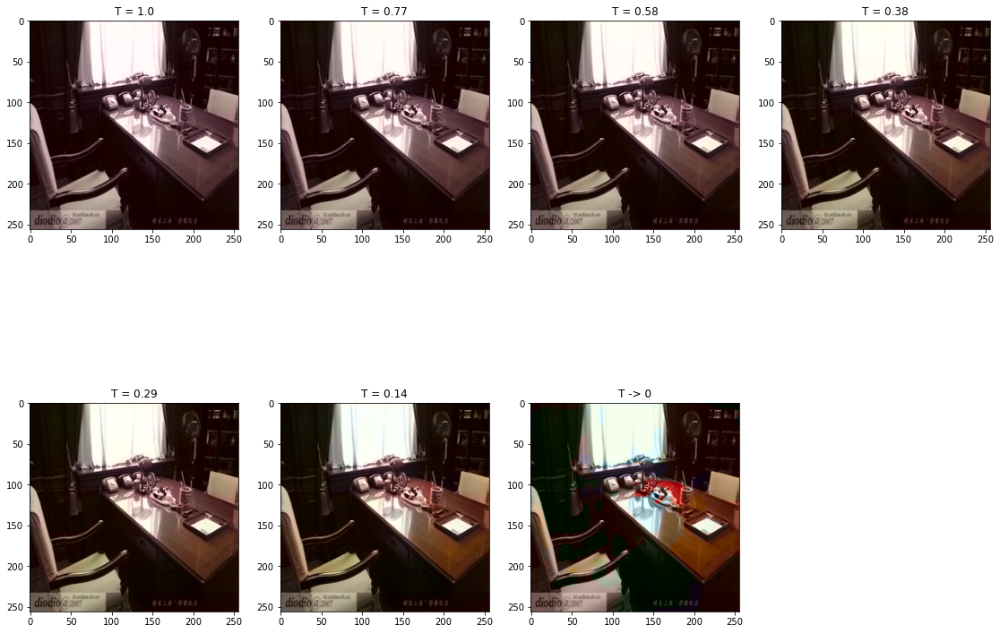

In [219]:
checkpoint = torch.load(os.path.join("./CrossEntropy_Model/Test8/","CEBwC8_0_47.pt"),map_location=torch.device('cpu'))
model = ColorizationModel(classification=True)
model.load_state_dict(checkpoint['model_state_dict'])
training_set.shuffle_dataset()
img = load_img("./TRAIN/" + training_set.dataset_list[0])
q, qq = quantize_lab()
(tens_orig_l, img_l_rs, tens_orig_ab, img_ab_rs) = preprocess_img_classification(img, q)
input = torch.tensor(img_l_rs)[None,None,:,:].type(torch.FloatTensor).to("cuda")
model.to("cuda")
predicted_ab = model(input)


pr1 = predicted_ab[0].cpu().detach().numpy()
pr2 = pr1 + np.abs(pr1.min())
pr3 = (pr2/pr2.sum(0)) + 0.00000001

T = [1., .77, .58, .38, .29, .14]
b2_L = []
cont = 1
for t in T:
    b2 = np.exp(np.log(pr3)/t)
    b2_o = (b2/b2.sum(0)).round(7)
    b2_L.append(b2_o)
    print("\r" + str(t),end='')
print("")

cont = 1
plt.figure(figsize=(6.4*3, 4.8*3), constrained_layout=False)
for b in b2_L:
    print("\r" + str(cont),end='')
    ccc = np.dot(np.swapaxes(np.swapaxes(b, 0, 1), 1, 2) , np.array(list(qq.values())))
    asdfa = color.rgb2lab(ccc)
    asdfa[:,:,0] = img_l_rs
    plt.subplot(2, 4, cont), plt.imshow(color.lab2rgb(asdfa)), plt.title("T = " + str(T[cont-1]))
    cont += 1
plt.subplot(2,4,7), plt.imshow(testing("./TRAIN/" + training_set.dataset_list[0], model)), plt.title(label = "T -> 0")

(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x24bb397ae20>)

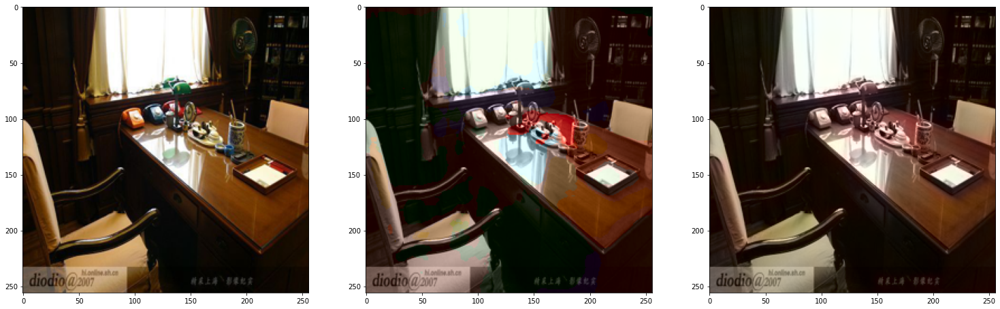

In [220]:
plt.figure(figsize=(6.4*4, 4.8*4), constrained_layout=False)
plt.subplot(131), plt.imshow(resize_img(load_img("./TRAIN/" + training_set.dataset_list[0])))
plt.subplot(132), plt.imshow(testing("./TRAIN/" + training_set.dataset_list[0], model))
plt.subplot(133), plt.imshow(color.lab2rgb(asdfa))

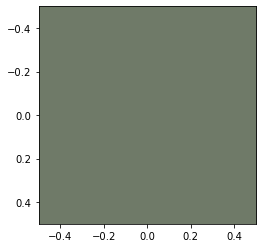

In [216]:
plt.imshow([[testing("./TRAIN/" + training_set.dataset_list[0], model)[30][60]]])

(<matplotlib.image.AxesImage at 0x25fafdb0af0>,
 array([44.09958602,  0.31131724, -1.35276116]))

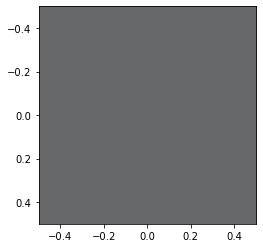

In [329]:
ccc = np.dot(np.swapaxes(b2_L[24], 0, 2) , np.array(list(qq.values())))
asdfa = color.rgb2lab(ccc)
asdfa[:,:,0] = img_l_rs
plt.imshow([[color.lab2rgb(asdfa)[30][60]]])

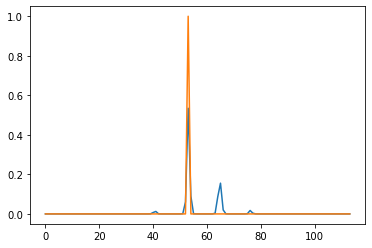

In [336]:
plt.plot(np.linspace(0,113,114), b2_L[24][:,30,60])
a = np.zeros(114)
a[img_ab_rs[30][60]] = 1
plt.plot(np.linspace(0,113,114), a)

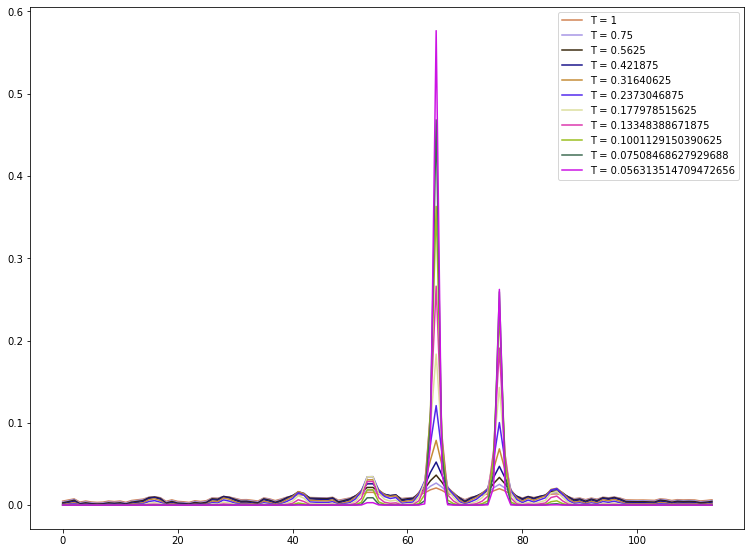

In [242]:
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
T = 1
for b in b2_L:
    c = [random.uniform(0, 1), random.uniform(0, 1), random.uniform(0, 1)]
    plt.plot(np.linspace(0, 113, 114), np.swapaxes(b, 0, 2)[11][110], color = c, label = "T = " + str(T))
    T = T*0.75
plt.legend()

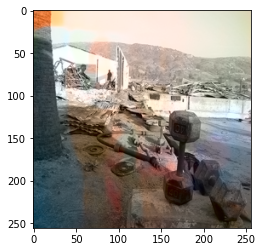

In [282]:
bswap = np.swapaxes(b, 0, 2)
out = np.zeros((256,256,3))
for i in range(256):
    for j in range(256):
        w = bswap[i][j]
        out[i][j] = w@np.array(list(qq.values()))
asdfa = color.rgb2lab(out)
asdfa[:,:,0] = img_l_rs
plt.imshow(color.lab2rgb(asdfa))

In [237]:
x = np.array([np.log(-1),1,2,3])


C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_3856/2732940642.py:1: RuntimeWarning: invalid value encountered in log
  x = np.array([np.log(-1),1,2,3])


True

In [19]:
# import torchvision.models as models
# # device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model_ft = models.vgg16(pretrained=True)
vgg16 = models.vgg16_bn()
vgg16.load_state_dict(torch.load("../input/vgg16bn/vgg16_bn.pth"))
print(vgg16.classifier[6].out_features) # 1000 

FileNotFoundError: [Errno 2] No such file or directory: '../input/vgg16bn/vgg16_bn.pth'

In [32]:
checkpoint = torch.load(os.path.join("./CrossEntropy_Model/Test8/","CEBwC8_0_47.pt"),map_location=torch.device('cpu'))
mymodel = ColorizationModel(classification=True)
mymodel.load_state_dict(checkpoint['model_state_dict'])
training_set.shuffle_dataset()
inp = testing("./TRAIN/" + training_set.dataset_list[0], mymodel)


# x = torch.randn(1, 3, 224, 224)
x = 
model = models.vgg16(pretrained=True) # pretrained=False just for debug reasons
first_conv_layer = [nn.Conv2d(3, 3, kernel_size=3, stride=1, padding=1, dilation=1, groups=1, bias=True)]
first_conv_layer.extend(list(model.features))  
model.features= nn.Sequential(*first_conv_layer )  
output = model(x)

C:\Users\Omar Bayoumi\anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 274 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


In [27]:
output.shape

torch.Size([1, 1000])

In [75]:
list_out = []
n = 5
training_set.shuffle_dataset()
for im_path in training_set.dataset_list:
  img = load_img("./TRAIN/" + im_path)
  q,qq = quantize_lab()
  (tens_orig_l, img_l_rs, tens_orig_ab, img_ab_rs) = preprocess_img_classification(img, q)
  input = torch.tensor(img_l_rs)[None,None,:,:].type(torch.FloatTensor)
  predicted_ab = model(input)
  out = np.zeros((256, 256, 3))
  for i in range(256):
    for j in range(256):
      # x = (img_ab_rs[i][j]+128)//16
      lista = np.array(predicted_ab[0,:,i,j].tolist())
      x = lista.argmax()
      # x = img_ab_rs[i][j]
      for value in q.values():
        if (value == x):
          lab = color.rgb2lab([[qq[value]]])[0][0]
          l = img_l_rs[i][j]
          lab[0] = l
          rgb = color.lab2rgb([[lab]])[0][0]
          out[i][j] = rgb
          break
  list_out.append(out)
  print(len(list_out))
  if (len(list_out) == n):
    break

C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:98: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:99: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:100: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c


1
2
3
4
5


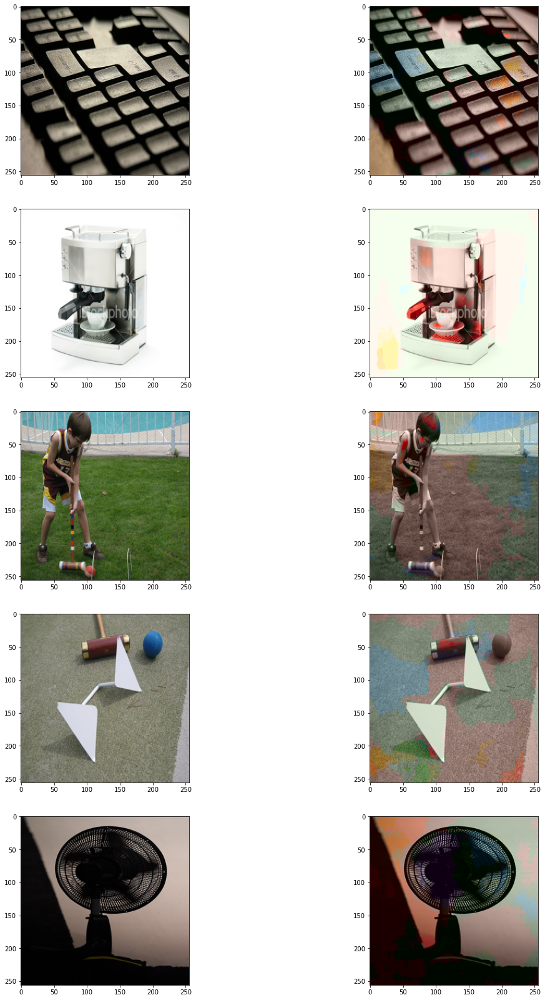

In [76]:
plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
for i in range(n):
    img = load_img("./TRAIN/"+ training_set.dataset_list[i])
    plt.subplot(n,4,((i+1)*4)-2), plt.imshow(resize_img(img))
    plt.subplot(n,4,((i+1)*4)-1), plt.imshow(list_out[i])

In [77]:
list_out = []
validation_set.shuffle_dataset()
for im_path in validation_set.dataset_list:
  img = load_img("./VALID/" + im_path)
  q,qq = quantize_lab()
  (tens_orig_l, img_l_rs, tens_orig_ab, img_ab_rs) = preprocess_img_classification(img, q)
  input = torch.tensor(img_l_rs)[None,None,:,:].type(torch.FloatTensor)
  predicted_ab = model(input)
  out = np.zeros((256, 256, 3))
  for i in range(256):
    for j in range(256):
      # x = (img_ab_rs[i][j]+128)//16
      lista = np.array(predicted_ab[0,:,i,j].tolist())
      x = lista.argmax()
      # x = img_ab_rs[i][j]
      for value in q.values():
        if (value == x):
          lab = color.rgb2lab([[qq[value]]])[0][0]
          l = img_l_rs[i][j]
          lab[0] = l
          rgb = color.lab2rgb([[lab]])[0][0]
          out[i][j] = rgb
          break
  list_out.append(out)
  print(len(list_out))
  if (len(list_out) == n):
    break

C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:98: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:99: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:100: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c


1
2
3
4
5


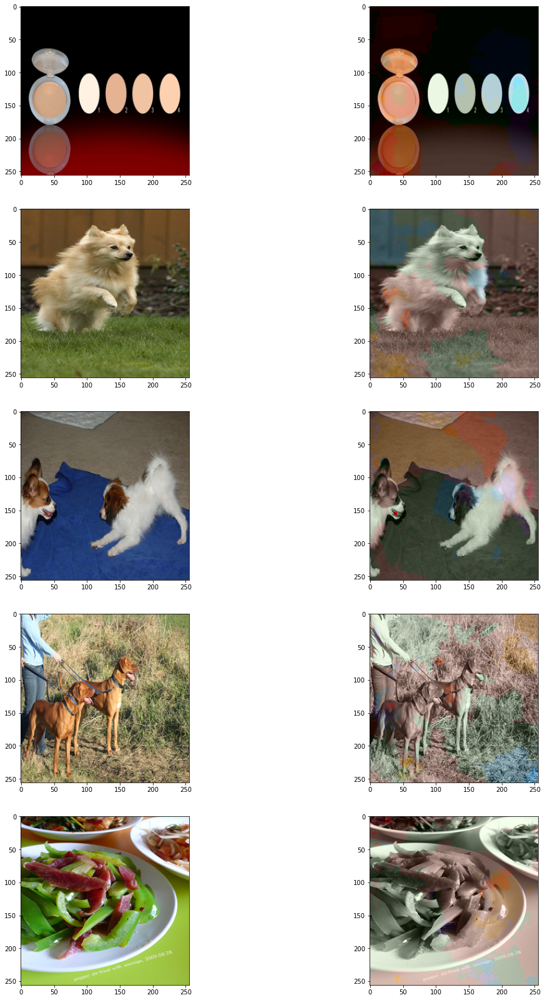

In [78]:
plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
for i in range(n):
    img = load_img("./VALID/"+ validation_set.dataset_list[i])
    plt.subplot(n,4,((i+1)*4)-2), plt.imshow(resize_img(img))
    plt.subplot(n,4,((i+1)*4)-1), plt.imshow(list_out[i])

In [79]:
list_out = []
test_set.shuffle_dataset()
for im_path in test_set.dataset_list:
  img = load_img("./TEST/" + im_path)
  q,qq = quantize_lab()
  (tens_orig_l, img_l_rs, tens_orig_ab, img_ab_rs) = preprocess_img_classification(img, q)
  input = torch.tensor(img_l_rs)[None,None,:,:].type(torch.FloatTensor)
  predicted_ab = model(input)
  out = np.zeros((256, 256, 3))
  for i in range(256):
    for j in range(256):
      # x = (img_ab_rs[i][j]+128)//16
      lista = np.array(predicted_ab[0,:,i,j].tolist())
      x = lista.argmax()
      # x = img_ab_rs[i][j]
      for value in q.values():
        if (value == x):
          lab = color.rgb2lab([[qq[value]]])[0][0]
          l = img_l_rs[i][j]
          lab[0] = l
          rgb = color.lab2rgb([[lab]])[0][0]
          out[i][j] = rgb
          break
  list_out.append(out)
  print(len(list_out))
  if (len(list_out) == n):
    break

C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:98: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][0] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:99: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][1] /= c
C:\Users\OMARBA~1\AppData\Local\Temp/ipykernel_16236/3958451798.py:100: RuntimeWarning: invalid value encountered in double_scalars
  classes_grid[i][j][2] /= c


1
2
3
4
5


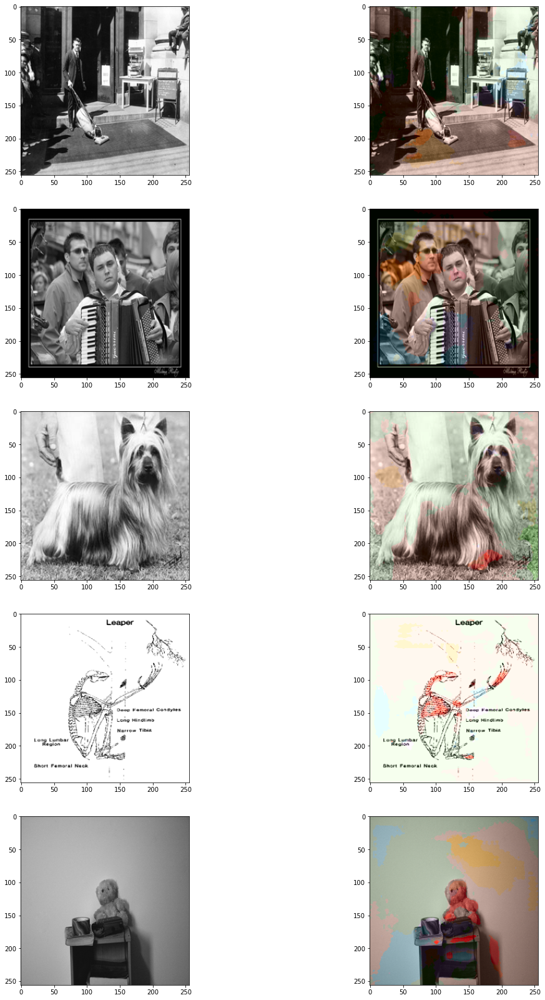

In [80]:
plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
for i in range(n):
    img = load_img("./TEST/"+ test_set.dataset_list[i])
    plt.subplot(n,4,((i+1)*4)-2), plt.imshow(resize_img(img))
    plt.subplot(n,4,((i+1)*4)-1), plt.imshow(list_out[i])

[0.03124266 0.51586699 0.62001929]


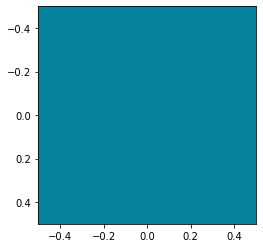

In [ ]:
for i in classes.values():
  if i[0] == 137:
    print(i[1])
    d = [[i[1]]]

plt.imshow(d)

In [ ]:
freq = [0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
        0.0,       0.0,        0.0,        29478.0,    2.0,        0.0,         0.0,         0.0,         3517.0,      11591.0,    14263.0,   6694.0,    6768.0,    4906.0,
        1947.0,    2621.0,     6591.0,     4058.0,     910.0,      49.0,        0.0,         0.0,         204208.0,    1185223.0,  951169.0,  318407.0,  171375.0,  47153.0,
        23993.0,   21082.0,    13323.0,    10590.0,    31646.0,    129222.0,    0.0,         0.0,         0.0,         237111.0,   1430344.0, 3551779.0, 1938665.0, 732482.0,
        272719.0,  108148.0,   77607.0,    41954.0,    129078.0,   153740.0,    6913.0,      0.0,         0.0,         0.0,        0.0,       476929.0,  1938794.0, 5008916.0,
        6796123.0, 2514742.0,  976780.0,   332753.0,   217108.0,   546293.0,    429966.0,    136974.0,    0.0,         0.0,        0.0,       0.0,       4470.0,    865917.0,
        4036038.0, 14742383.0, 25234848.0, 15578649.0, 3131558.0,  1379403.0,   1994040.0,   1388334.0,   228313.0,    0.0,        0.0,       0.0,       0.0,       0.0,
        115380.0,  1136856.0,  4016682.0,  18828562.0, 77237385.0, 219170250.0, 132613590.0, 17049342.0,  5448375.0,   925197.0,   16997.0,   0.0,       0.0,       0.0,
        0.0,       0.0,        302629.0,   812889.0,   2176032.0,  8705712.0,   32072995.0,  267616353.0, 112518803.0, 15518080.0, 1993597.0, 109010.0,  0.0,       0.0,
        0.0,       0.0,        0.0,        0.0,        233272.0,   322734.0,    1827043.0,   6967429.0,   7924937.0,   4488878.0,  2398659.0, 940958.0,  125184.0,  0.0,
        0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         24975.0,     142261.0,    877927.0,    1535083.0,  832243.0,  427516.0,  250936.0,  64113.0,
        0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         32223.0,     85673.0,    295890.0,  181332.0,  141524.0,  48985.0,
        34398.0,   0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         10740.0,    47500.0,   19261.0,   11962.0,   1677.0,
        6.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         43064.0,    11708.0,   536.0,     0.0,       0.0,
        0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
        0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0]

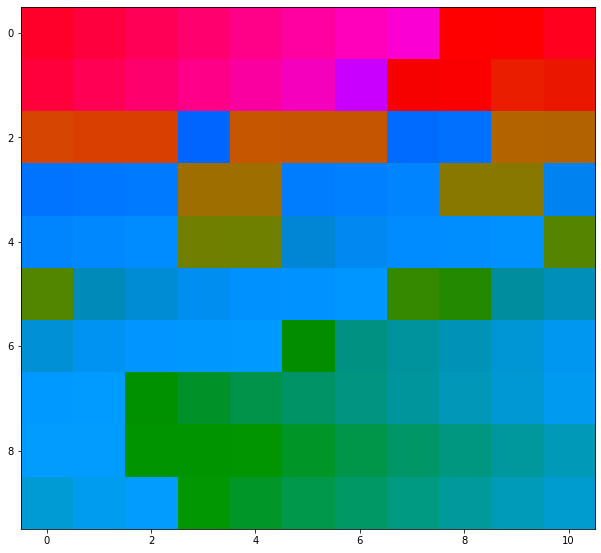

In [ ]:
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.imshow(c0color)

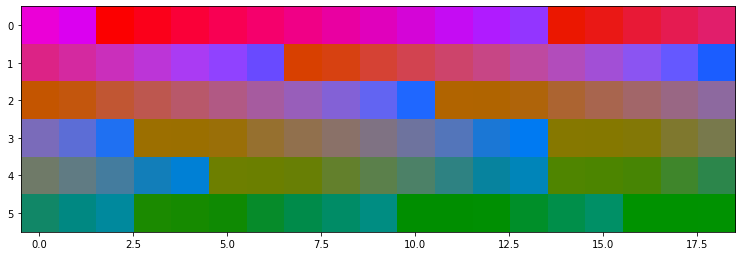

In [ ]:
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.imshow(notc0color)

#SCHIFEZZE

In [ ]:
import time

print("\r" + "|---------|", end='')
for j in range(10):
  for i in range(100000):
    c = i//10000
    print("\r" + "epoch " + str(j) + " batch " + str(c) + "/9 |" + "="*c + "-"*(9-c) + "|", end='')
    #time.sleep(0.5)
  print("")


epoch 0 batch 9/9 |=========|
epoch 1 batch 9/9 |=========|
epoch 2 batch 9/9 |=========|
epoch 3 batch 9/9 |=========|
epoch 4 batch 9/9 |=========|
epoch 5 batch 9/9 |=========|
epoch 6 batch 9/9 |=========|
epoch 7 batch 9/9 |=========|
epoch 8 batch 9/9 |=========|
epoch 9 batch 2/9 |==-------|

KeyboardInterrupt: ignored

In [ ]:
original = r"d/164978.JPEG"
target = r"TRAIN/164978.JPEG"

shutil.move(original,target)

'TRAIN/164978.JPEG'

In [ ]:
l1 = [f for f in listdir("TEST/") if isfile(join("TEST/", f))]
l2 = [f for f in listdir("VALID/") if isfile(join("VALID/", f))]
l3 = [f for f in listdir("TRAIN/") if isfile(join("TRAIN/", f))]
len(l1), len(l2), len(l3)

(3000, 3000, 16000)

In [ ]:
r = random.sample(l2, 1500)

In [ ]:
len(r)

1500

In [ ]:
c = 0
for file in r:
  print(c)
  c+=1
  os.remove("./VALID/" + file)

In [ ]:
for i in range(8):
  print(i)
  test_file_name = "./RIP SSD DI CRISTIANO/Trainzip/Train" + str(i+130) + ".zip"

  with ZipFile(test_file_name, 'r') as zipObj:
    # Extract all the contents of zip file in different directory
    zipObj.extractall("./TRAIN/")
  print(len([f for f in listdir("TRAIN/") if isfile(join("TRAIN/", f))]))

0
2000
1
4000
2
6000
3
8000
4
10000
5
12000
6
14000
7
16000


In [ ]:
[f for f in listdir("d/") if isfile(join("d/", f))][200]

In [ ]:
len([f for f in listdir("TRAIN/") if isfile(join("TRAIN/", f))])

0

In [ ]:
test_file_name = "./RIP SSD DI CRISTIANO/Trainzip/Train117.zip"

with ZipFile(test_file_name, 'r') as zipObj:
  # Extract all the contents of zip file in different directory
  zipObj.extractall("./TRAIN/")

In [ ]:
# torch.cuda.empty_cache()
model = ColorizationModel()
# model.to("cuda")
training_set = Dataset(40, "./TRAIN/")
tens_input = training_set.get_batch(0)
predicted_ab = model(tens_input['resized_l'])

Dataset list length: 16000


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


In [ ]:
frequencies =[0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
              0.0,       0.0,        0.0,        29478.0,    2.0,        0.0,         0.0,         0.0,         3517.0,      11591.0,    14263.0,   6694.0,    6768.0,    4906.0,
              1947.0,    2621.0,     6591.0,     4058.0,     910.0,      49.0,        0.0,         0.0,         204208.0,    1185223.0,  951169.0,  318407.0,  171375.0,  47153.0,
              23993.0,   21082.0,    13323.0,    10590.0,    31646.0,    129222.0,    0.0,         0.0,         0.0,         237111.0,   1430344.0, 3551779.0, 1938665.0, 732482.0,
              272719.0,  108148.0,   77607.0,    41954.0,    129078.0,   153740.0,    6913.0,      0.0,         0.0,         0.0,        0.0,       476929.0,  1938794.0, 5008916.0,
              6796123.0, 2514742.0,  976780.0,   332753.0,   217108.0,   546293.0,    429966.0,    136974.0,    0.0,         0.0,        0.0,       0.0,       4470.0,    865917.0,
              4036038.0, 14742383.0, 25234848.0, 15578649.0, 3131558.0,  1379403.0,   1994040.0,   1388334.0,   228313.0,    0.0,        0.0,       0.0,       0.0,       0.0,
              115380.0,  1136856.0,  4016682.0,  18828562.0, 77237385.0, 219170250.0, 132613590.0, 17049342.0,  5448375.0,   925197.0,   16997.0,   0.0,       0.0,       0.0,
              0.0,       0.0,        302629.0,   812889.0,   2176032.0,  8705712.0,   32072995.0,  267616353.0, 112518803.0, 15518080.0, 1993597.0, 109010.0,  0.0,       0.0,
              0.0,       0.0,        0.0,        0.0,        233272.0,   322734.0,    1827043.0,   6967429.0,   7924937.0,   4488878.0,  2398659.0, 940958.0,  125184.0,  0.0,
              0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         24975.0,     142261.0,    877927.0,    1535083.0,  832243.0,  427516.0,  250936.0,  64113.0,
              0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         32223.0,     85673.0,    295890.0,  181332.0,  141524.0,  48985.0,
              34398.0,   0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         10740.0,    47500.0,   19261.0,   11962.0,   1677.0,
              6.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         43064.0,    11708.0,   536.0,     0.0,       0.0,
              0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0,
              0.0,       0.0,        0.0,        0.0,        0.0,        0.0,         0.0,         0.0,         0.0,         0.0,        0.0,       0.0,       0.0,       0.0]

frequencies_not0 = []
for i in frequencies:
  if (i != 0.0):
    frequencies_not0.append(i)
distribution = frequencies_not0/np.array(frequencies_not0).sum()
gaussian_distribution = gaussian_filter(distribution, 5)

def v(p_tilde, l):
  return 1/((1-l)*p_tilde + l/114)

weighting_factor = v(gaussian_distribution, 0.5)
# np.dot(gaussian_distribution, weighting_factor)
gaussian_distribution.shape, weighting_factor.shape

((114,), (114,))

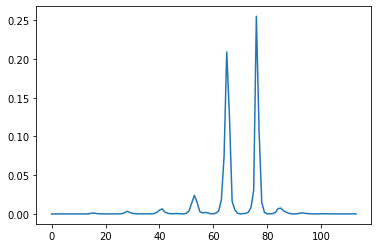

In [ ]:
plt.plot(np.linspace(0,113,114), distribution)

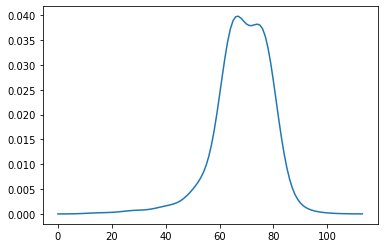

In [ ]:
plt.plot(np.linspace(0,113,114), gaussian_distribution)

In [ ]:
np.power(10.0, -1.0)

0.1

In [9]:
now = datetime.now()
current_time = now.strftime("%H:%M:%S")
print("Current Time =", current_time)
print(torch.cuda.is_available())

Current Time = 23:36:39
True


# Dataset class

In [ ]:
ds = Dataset(60, "./MiniDataset/")
i = 0
b = ds.get_batch(i)
b["resized_ab"].shape
plt.imshow(b["resized_l"][1][0].numpy())
ds.dataset_list[60]
(Batch, img)

# Dataloader class

In [ ]:
# Class used in order to translate the indexed version of the dataset into a pytorch tensor version
class DataloaderHW2():  
  
    def __init__(self, dataset:DatasetHW2, device, batch_size):
        self.dataset      = dataset
        self.device       = device
        self.batch_number = 0
        self.batch_size   = batch_size
      
    def get_tokens_length(self):
      return self.dataset.get_tokens_length()

    def get_whole_gold(self):
        step = 0
        concatenated_tensor = None
        # I tried to use torch.empty_like but it gave some problem: the concatenation we
        print(" IL PRIMO TENSORE CHE CREO: \n",concatenated_tensor)
        # Return a tensor. .
        while(True):
          dataset_batch = self.dataset.get_batch(step)

          # None means that last batch has been returned
          if (dataset_batch == None):
            break
          #if (step>5):
          #  break
          label_batch_tensor = torch.zeros( len(dataset_batch), self.dataset.max_sentence_length, dtype=torch.int64).to(self.device)
          for i in range(len(dataset_batch)):
            for j in range(len(dataset_batch[i])):
                label_batch_tensor[i][j]=dataset_batch[i][j]['LABEL']
                if(dataset_batch[i][j]['LABEL']>34):
                  print("ERRORE!!!!!!!! \n", dataset_batch[i][j]['LABEL'])
                  print("TUTTO IL BATCH È :\n",dataset_batch[i][j])
          if (step==0):
            concatenated_tensor = label_batch_tensor
          else: 
            concatenated_tensor = torch.cat((concatenated_tensor,label_batch_tensor), dim=0)
          
          step += 1
        return concatenated_tensor


    # Get the indexed batch and then create torch tensors. Note that 0 is the padding index
    def get_batch(self, batch_number):
        self.batch_number = batch_number
        dataset_batch = self.dataset.get_batch(batch_number)
        # None means that last batch has been returned
        if(dataset_batch == None):
          return None
        words_batch_tensor = torch.zeros( len(dataset_batch), self.dataset.max_sentence_length, dtype=torch.int64).to(self.device)
        pos_batch_tensor = torch.zeros( len(dataset_batch), self.dataset.max_sentence_length, dtype=torch.int64).to(self.device)
        lemma_batch_tensor = torch.zeros( len(dataset_batch), self.dataset.max_sentence_length, dtype=torch.int64).to(self.device)
        label_batch_tensor = torch.zeros( len(dataset_batch), self.dataset.max_sentence_length, dtype=torch.int64).to(self.device)
        mask_batch_tensor = torch.zeros( (len(dataset_batch), self.dataset.max_sentence_length,1), dtype=torch.float32).to(self.device)

        heads  = []
        for i in range(len(dataset_batch)):
          for j in range(len(dataset_batch[i])):
              # A trick in order to give to give to the GCL the depedency heads tensor.
              if(j==0):
                heads.append(dataset_batch[i][j]['HEADS'])
              words_batch_tensor[i][j]=dataset_batch[i][j]['TOKEN']
              pos_batch_tensor[i][j]=dataset_batch[i][j]['POS']
              lemma_batch_tensor[i][j]=dataset_batch[i][j]['LEMMA']
              label_batch_tensor[i][j]=dataset_batch[i][j]['LABEL']
              mask_batch_tensor[i][j][0]=dataset_batch[i][j]['MASK']
               
        batch = {"INPUT":words_batch_tensor , "POS":pos_batch_tensor , "LEMMA":pos_batch_tensor , "OUTPUT":label_batch_tensor, "HEADS":heads, "MASK":mask_batch_tensor}
        return batch

# Trainer class


In [ ]:

class Trainer():
    def __init__(
        self,
        model: nn.Module,
        loss_function,
        optimizer,
        checkpoint_path,
        filename):

        self.model = model
        self.loss_function = loss_function
        self.optimizer = optimizer
        self.last_epoch=0

        # Load the model, if it exists
        try:
          checkpoint=None
          if (DEVICE)=="cuda":
           checkpoint = torch.load(os.path.join(checkpoint_path,filename))
          else:
           checkpoint = torch.load(os.path.join(checkpoint_path,filename),map_location=torch.device('cpu'))
          self.model.load_state_dict(checkpoint['model_state_dict'])
          self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
          # We are going to continue the training starting from last epoch
          self.last_epoch = checkpoint['epoch']
          self.loss_function = checkpoint['loss']
          print(" PARAMETERS LOADED " )
        except Exception as e:
          print(e)
          #raise RuntimeError("CANNOTLOAD")
          print("CANNOT LOAD ",filename)

    def train(self, training_set, epochs):
        print('Training started.')
        train_loss = 0.0
        train_list_loss = []
        valid_list_loss = []
        max_macro_F1=0

        if (self.last_epoch != 0):
          self.last_epoch +=1
        for epoch in range(self.last_epoch,epochs+1):

            print(' Epoch {:03d}'.format(epoch))
            epoch_loss = 0.0

            # Model in training mode
            self.model.train()

            step=0
            epochs_since_last_improvement = 0
            # Training on the entire training set.

            while(True):
                sample = training_set["Data"]
                labels = training_set["Labels"]

                # If the whole dataset has been processed..
                # the training ends, but the dataset is shuffled for the next epoch.
                if(sample==None):
                  train_tensor_dataset.dataset.shuffle_dataset()
                  break

                # Set gradients to zero
                self.optimizer.zero_grad()
                predictions = self.model(words, lemma, pos, edges, masks)

                #predictions = predictions.view(-1, predictions.shape[-1])
                #labels = labels.view(-1)

                #sample_loss = self.loss_function(predictions, labels)
                #sample_loss.backward()
                #self.optimizer.step()

                #epoch_loss += sample_loss.item()
                #step+=1


            # Every 10 epochs
            # Print some informations 
            # Write to the report file in Google Drive the current performances on the Validation set
            # Save the corresponding model in Google Drive 

            if ( epoch%2 == 0 ):
                now = datetime.now()
                current_time = now.strftime("%H:%M:%S")
                print("Current Time =", current_time)

                F1s = compute_F1(self.model, valid_tensor_dataset, labels_vocab_itos)
                per_class_F1 = F1s["per_class_f1"]
                print("Micro F1: {}\nMacro F1: {}".format(F1s["micro_f1"], F1s["macro_f1"]))
                print("Per class F1:")
                lista_stringa=["Micro F1: {}\nMacro F1: {}".format(F1s["micro_f1"],F1s["macro_f1"]),"\n","Per class F1:\n"]
                for idx_class, F1 in sorted(enumerate(per_class_F1), key=lambda elem: -elem[1]):
                    label = labels_vocab_itos[idx_class]
                    lista_stringa.append(str(label)+""+str(F1)+"\n")
                    print(label, F1)                    
                stringa_per_file=""
                for stringa_report in lista_stringa:
                  stringa_per_file=stringa_per_file + stringa_report


            
                print('\t[E: {:2d} @ step {}] current avg loss = {:0.4f}'.format(epoch, step, epoch_loss / (step + 1)))
                nome_file = "ner_model_notte_"+str(val_embedding_size)
                nome_file = nome_file + "_"+str(val_hidden_dim)
                nome_file = nome_file + "_"+str(val_dropout)
                nome_file = nome_file + "_"+str(epoch)
                nome_file = nome_file +".pt"
                with open(report_file_path,'a+') as report_file:
                    report_file.write("TIME "+current_time+" MODEL "+nome_file+' OUTPUT [E: {:2d} @ step {}] current avg loss =  §§{:0.4f}§§\n'.format(epoch, step, epoch_loss / (step + 1))+"\n"+stringa_per_file)
                save_current_model(CHECK_PATH, self.model, self.optimizer, epoch, self.loss_function, nome_file)



            # epoch loop: start a new epoch or print the final training results
                
            number_of_computed_losses = (step)
            avg_epoch_loss = epoch_loss / number_of_computed_losses
            train_loss += avg_epoch_loss
            train_list_loss.append(avg_epoch_loss)
            
            print('\t[E: {:2d}] train loss = {:0.4f}'.format(epoch, avg_epoch_loss))

            valid_loss = self.evaluate(valid_tensor_dataset)
            valid_list_loss.append(valid_loss)

            print('  [E: {:2d}] valid loss = {:0.4f}'.format(epoch, valid_loss))
        
        print('Done')
        avg_epoch_loss = train_loss / epochs
        print(' AVG epoch loss = {:0.4f}'.format(avg_epoch_loss))

        train_loss_list_string = ""
        for elem in train_list_loss:
          train_loss_list_string += ","+str(elem)
        
        valid_loss_list_string = ""
        for elem in train_list_loss:
          valid_loss_list_string += ","+str(elem)
        

        with open(report_file_path,'a+') as report_file:
          report_file.write("TIME "+current_time+" MODEL "+nome_file+ " TRAIN LOSS LIST OVER EACH EPOCH:" + train_loss_list_string + "\n")

        with open(report_file_path,'a+') as report_file:
          report_file.write("TIME "+current_time+" MODEL "+nome_file+ " VALID LOSS LIST OVER EACH EPOCH:" + train_loss_list_string + "\n")
        return train_loss_list_string , valid_loss_list_string, avg_epoch_loss
    

    def evaluate(self, valid_tensor_dataset):

        valid_loss = 0.0

        # Evaluation mode. Dropout set to 0.
        self.model.eval()
        step=0

        # We don't want the model compute gradients since we are in evaluating phase
        with torch.no_grad():
            while(True):
                sample=valid_tensor_dataset.get_batch(step)
                if(sample==None):
                  break
                words = sample['INPUT']
                pos = sample['POS']
                lemma = sample['LEMMA']
                edges = sample['HEADS']
                labels = sample['OUTPUT']
                masks = sample["MASK"]

                logits = self.model(words, lemma, pos, edges, masks)
                predictions = logits.view(-1, logits.shape[-1])
                labels = labels.view(-1)
                sample_loss = self.loss_function(predictions, labels)
                valid_loss += sample_loss.tolist()
                step+=1

        return valid_loss / step

    def predict(self, test_dataloader):
      
        # Evaluation mode. Dropout set to 0.
        self.model.eval()

        with torch.no_grad():
          logits_list=[]
          step=0

          while(True):

              sample=test_dataloader.get_batch(step)   
              if(sample==None):
                break

              words = sample['INPUT']
              pos = sample['POS']
              lemma = sample['LEMMA']
              labels = sample['OUTPUT']
              edges = sample['HEADS']
              masks = sample["MASK"]

              logits =self.model(words, lemma, pos, edges, masks)
              labels = labels.view(-1)
              logits_list.append(logits)
              step+=1
        concatenated_tensor = torch.empty_like(logits_list[0])
        for tensor in logits_list:
          concatenated_tensor = torch.cat((concatenated_tensor,tensor), dim=0)
        # Return a list of tensors. Each element corresponds to a batch.
        return concatenated_tensor, torch.argmax(concatenated_tensor,dim=-1) 

# Metrics functions


In [ ]:
# Method for the evaluation phase
def compute_F1(model:nn.Module, l_dataset:DataloaderHW2, l_label_vocab):
    all_predictions = list()
    all_labels = list()
    step=0
    while(True):
        sample=l_dataset.get_batch(step)
        if(sample==None):
          break
        words = sample['INPUT']
        pos = sample['POS']
        lemma = sample['LEMMA']
        labels = sample['OUTPUT']
        edges = sample['HEADS']
        masks = sample["MASK"]

        predictions =model(words, lemma, pos, edges, masks)
        predictions = torch.argmax(predictions, -1).view(-1)
        labels = labels.view(-1)
        valid_indices = labels != 0
        
        valid_predictions = predictions[valid_indices]
        valid_labels = labels[valid_indices]
        
        all_predictions.extend(valid_predictions.tolist())
        all_labels.extend(valid_labels.tolist())
        step+=1
    # This microF1 takes into account class imbalance
    micro_F1 = f1_score(all_labels, all_predictions, average="micro", zero_division=0)
    # This macroF1 consider classes and arithmetic average of them.
    macro_F1 = f1_score(all_labels, all_predictions, average="macro", zero_division=0)
    per_class_F1 = f1_score(all_labels, all_predictions, labels = list(range(len(l_label_vocab.keys()))), average=None, zero_division=0)
    
    return {"micro_f1":micro_F1,
            "macro_f1":macro_F1, 
            "per_class_f1":per_class_F1}


import sklearn
def compute_confusion_matrix(trainer, test_dataset, test_dataloader):
            
  labels_for_f1 = [*range(1,35)]
  print("LABELS FOR F1\n***********************************************************\n*************************************",labels_for_f1)
  _ , output_predictions = trainer.predict(test_dataloader)
  labels = test_dataloader.get_whole_gold()
  print("LABEL OF THE RETURNED: ",labels.shape)
  print("LABEL OF THE output_predictions: ",output_predictions.shape)
  #for i in range(labels.shape[0]):
  #  print("Sentence ",i)
  #  for j in range(labels.shape[1]):
  #    print(labels[i][j], end=" ")
  print("LABELS\n***************************************************\n",test_dataset.labels_vocab_stoi)
  #print("PREDICTED\n***************************************************\n",torch.flatten(output_predictions).tolist())
  labels_present = []
  for elem in torch.flatten(labels).tolist():
    if(elem not in labels_present):
      labels_present.append(elem)
  print("LABELS PRESENTI NEL TRUE \n***************************************************\n",labels_present)
  labels_present = []

  for elem in torch.flatten(output_predictions).tolist():
    if(elem not in labels_present):
      labels_present.append(elem)
  print("LABELS PRESENTI NEL PREDICTED \n***************************************************\n",labels_present)
  #for elem in torch.flatten(labels).tolist():
  #  print(test_dataset.labels_vocab_itos[elem],sep=", ", end="")

  Ypred = []
  Ytarget= []
  output_predictions = torch.flatten(output_predictions).tolist()
  labels = torch.flatten(labels).tolist()

  for i in range(len(labels)):
    if (labels[i]!=0):
      Ypred.append(output_predictions[i])
      Ytarget.append(labels[i])
  return sklearn.metrics.confusion_matrix(Ytarget , Ypred, labels=labels_for_f1, normalize="true")

# Grid search

In [ ]:
# Loop over different hyperparameters settings. I let different notebooks computing and evaluating models full-time.
DO_TRAIN=True

#Note: EMB_SIZE now should be removed.... because it is inferred by knowing the pretrained embeddings dimension
for EMB_SIZE in [100]:
  for HIDD_DIM in [128,256,512]:
    for DROP in [0.1,0,2,0.3]:
      EMBEDDING_SIZE = EMB_SIZE
      HIDDEN_DIM = HIDD_DIM
      DROPOUT = DROP
      PARAMETERS = "_"+str(EMBEDDING_SIZE)+"_"+str(HIDDEN_DIM)+"_"+str(DROPOUT)+".pkl"
      report_file_path = CHECK_PATH + "REPORT_"+"_"+str(EMBEDDING_SIZE)+"_"+str(HIDDEN_DIM)+"_"+str(DROPOUT)+".txt"
      print("I PARAMETRI CHE STO USANDO SONO :  ",PARAMETERS)
      # Let's create a parameter-dependent name file in order to save the different models and vocabs during the Grid Search


      training_set =   DatasetHW2(TRAIN_PATH, False, BATCH_SIZE, 
                               tokens_vocab_stoi_file_path_base + PARAMETERS, 
                               tokens_vocab_itos_file_path_base + PARAMETERS,
                               pos_vocab_stoi_file_path_base + PARAMETERS,
                               pos_vocab_itos_file_path_base + PARAMETERS,
                               lemma_vocab_stoi_file_path_base + PARAMETERS,
                               lemma_vocab_itos_file_path_base + PARAMETERS,
                               labels_vocab_stoi_file_path_base + PARAMETERS,
                               labels_vocab_itos_file_path_base + PARAMETERS
                               )
      validation_set = DatasetHW2(VALID_PATH, True, BATCH_SIZE,
                               tokens_vocab_stoi_file_path_base + PARAMETERS, 
                               tokens_vocab_itos_file_path_base + PARAMETERS,
                               pos_vocab_stoi_file_path_base + PARAMETERS,
                               pos_vocab_itos_file_path_base + PARAMETERS,
                               lemma_vocab_stoi_file_path_base + PARAMETERS,
                               lemma_vocab_itos_file_path_base + PARAMETERS,
                               labels_vocab_stoi_file_path_base + PARAMETERS,
                               labels_vocab_itos_file_path_base + PARAMETERS
                               )

      vectors = Vectors(base_path+"glove.6B.100d.txt", cache="./")
      pretrained_embeddings = torch.randn(len(training_set.tokens_vocab_itos), vectors.dim)
      initialised = 0
      for i, w in enumerate(training_set.tokens_vocab_stoi):
          #print("i, w\n",i,"\n",w)
          if w in vectors.stoi:
              initialised += 1
              vec = vectors.get_vecs_by_tokens(w)
              pretrained_embeddings[i] = vec
          
      pretrained_embeddings[training_set.tokens_vocab_stoi["<PAD>"]] = torch.zeros(vectors.dim)
      EMBEDDINGS = pretrained_embeddings
      print("initialised embeddings {}".format(initialised))
      print("random initialised embeddings {} ".format(len(training_set.tokens_vocab_itos) - initialised))

      class HParams():
          word_vocab_size = training_set.input_vocab_dim
          pos_vocab_size = training_set.pos_vocab_dim
          lemma_vocab_size = training_set.lemma_vocab_dim
          hidden_dim = HIDDEN_DIM
          word_embedding_dim = EMBEDDING_SIZE
          pos_embedding_dim = POS_EMBEDDING_DIM
          lemma_embedding_dim = LEMMA_EMBEDDING_DIM
          num_classes = training_set.labels_vocab_dim
          bidirectional = BIDIRECTIONAL
          num_layers = NUM_LAYERS_LSTM
          dropout = DROPOUT
          embeddings = EMBEDDINGS
      params = HParams()

      training_dataloader   = DataloaderHW2(training_set, DEVICE, BATCH_SIZE)
      validation_dataloader = DataloaderHW2(validation_set, DEVICE, BATCH_SIZE)

      neTaggerModel = None


      if(DEVICE.lower()=='cpu'):
        neTaggerModel = NETaggerModel(params).cpu()
        print("Running on CPU")
      elif(DEVICE.lower()=='cuda'):
        neTaggerModel = NETaggerModel(params).cuda()
        print("Running on CUDA")
      else:
        error_string="Device should be 'cpu' or 'cuda', but '"+DEVICE+"' found"
        raise RuntimeError(error_string)
      
      FILENAME   = "DO_NOT_LOAD_ANY_MODEL"
      trainer=Trainer(    
          model = neTaggerModel,
          loss_function = nn.CrossEntropyLoss(ignore_index=training_set.labels_vocab_stoi["<PAD>"]),
          optimizer =  optim.Adam(neTaggerModel.parameters()),
          checkpoint_path = CHECK_PATH,
          filename = FILENAME
      )

      # Plot the loss of both training and validation
      if(DO_TRAIN):
        train_loss, valid_loss, _ = trainer.train(training_dataloader,
                      validation_dataloader,
                      EMBEDDING_SIZE,
                      HIDDEN_DIM,
                      DROPOUT,
                      training_set.labels_vocab_itos,
                      epochs = EPOCHS)
        train_loss_list = train_loss.split(",")[1:]
        valid_loss_list = valid_loss.split(",")[1:]

        plot_train_list = [*range(len(train_loss_list))]
        plot_valid_list = [*range(len(valid_loss_list))]
        print(train_loss_list)
        print(valid_loss_list)
        print(plot_train_list)
        print(plot_valid_list)

        for index in range(len(train_loss_list)):
          train_loss_list[index]= (float)(train_loss_list[index])
        for index in range(len(valid_loss_list)):
          valid_loss_list[index]= (float)(valid_loss_list[index])


        print("AFTER CAST -------------------------------------------\n",train_loss_list)
        print(valid_loss_list)
        print(plot_train_list)
        print(plot_valid_list)
        import matplotlib.pyplot as plt
        plt.plot(plot_train_list,
                train_loss_list,
                plot_valid_list,
                valid_loss_list
                )
        plt.ylabel('LOSS')
        plt.show()
      else:
        break
    if(not DO_TRAIN):
      break
  if(not DO_TRAIN):
    break

I PARAMETRI CHE STO USANDO SONO :   _100_128_0.1.pkl
DEPENDENCY HEADS LENGTH:
 89153
Dataset read:  89153  lines.
VOCABS COMPUTED CORRECTLY ON THIS DATASET: /content/drive/My Drive/SECONDHWNLP/train.json
----------- BEGIN DATASET STATS -------------
labels is 
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ABSOLUTE:

<PAD> : 0
_ : 2369519
Experiencer : 3432
Agent : 54371
Theme : 51800
Location : 6537
Attribute : 19346
Time : 15766
Patient : 15504
Destination : 5352
Source : 2960
Negation : 3168
Product : 1521
Recipient : 2832
Cause : 1767
Modal : 9029
Topic : 4948
Connective : 4821
Beneficiary : 2174
Extent : 2924
Result : 4125
Asset : 1449
Purpose : 2324
Stimulus : 2566
Goal : 3129
Instrument : 924
Co-Agent : 660
Idiom : 20
Predicative : 68
Co-Theme : 1413
Value : 821
Material : 166
Co-Patient : 251
Recursive : 14
Modifier : 7
RATES:

<PAD> : 0.0
_ : 0.9128603833713191
Experiencer : 0.001322182618383886
Agent : 0.0209465009161277
Theme : 0.019956019706376834
Location : 0.002518388046729447
Attribute : 0.0074530725335823595
Time : 0.006073872716037397
Patient : 0.005972936863468464
Destination : 0.002061865202095151
Source : 0.0011403439832215333
Negation : 0.001220476263123587
Product : 0.0005859672967837677
Recipient : 0.0010910318109741157
Cause : 0.0006807391278217734
Modal : 0.00347

KeyboardInterrupt: ignored

# Results


In [ ]:
# To be executed after the model has been trained
test_set =   DatasetHW2(TEST_PATH, False, BATCH_SIZE, 
                          tokens_vocab_stoi_file_path_base + PARAMETERS, 
                          tokens_vocab_itos_file_path_base + PARAMETERS,
                          pos_vocab_stoi_file_path_base + PARAMETERS,
                          pos_vocab_itos_file_path_base + PARAMETERS,
                          lemma_vocab_stoi_file_path_base + PARAMETERS,
                          lemma_vocab_itos_file_path_base + PARAMETERS,
                          labels_vocab_stoi_file_path_base + PARAMETERS,
                          labels_vocab_itos_file_path_base + PARAMETERS
                          )
test_loader = DataloaderHW2(test_set, DEVICE, BATCH_SIZE)
conf_matrix = compute_confusion_matrix(trainer, test_set, test_loader)
print(conf_matrix)

DEPENDENCY HEADS LENGTH:
 4450
Dataset read:  4450  lines.
VOCABS COMPUTED CORRECTLY ON THIS DATASET: /content/drive/My Drive/SECONDHWNLP/test.json
----------- BEGIN DATASET STATS -------------
labels is 
 [['_', '_', '_', '_', '_', '_', 'Patient', '_', 'Negation', '_', 'Destination', 'Time', 'Time', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_'], ['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', 'Patient', '_', '_', 'Extent', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_'], ['_', 'Attribute', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', 'Agent', 'Attribute', '_', 'Theme', '_', '_', '_', '_', '_', '_'], ['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


LA MASCHERA:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] 



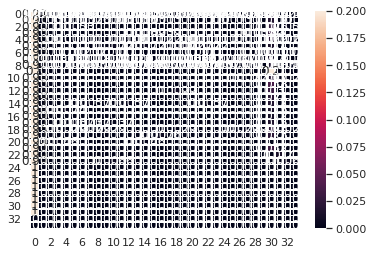

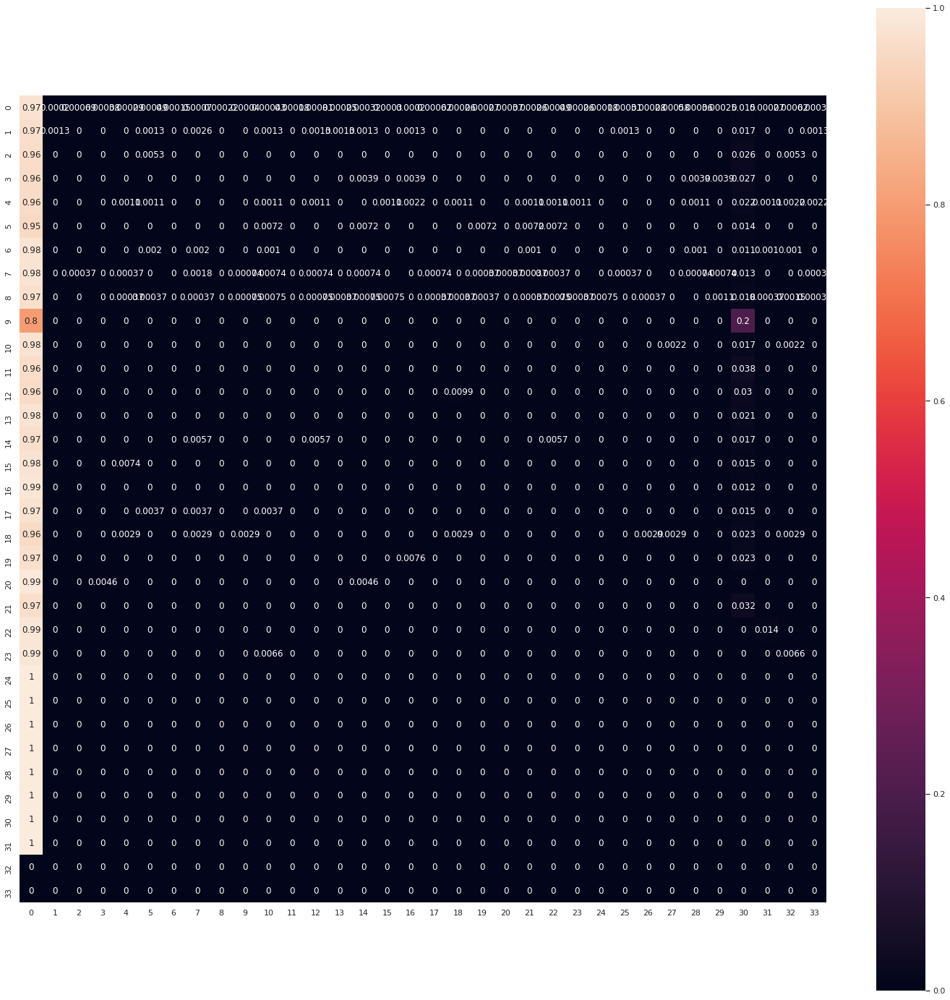

In [ ]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


uniform_data = conf_matrix
ax = sns.heatmap(uniform_data, vmin=0, annot=True,  vmax=0.2,linewidths=.5)

corr = np.corrcoef(np.random.randn(10, 200))
mask = np.zeros_like(uniform_data)
mask[np.triu_indices_from(mask)] = True
for i in range(len(mask)):
  for j in range(len(mask[i])):
    mask[i][j]=0
print("LA MASCHERA:\n",mask,"\n")
with sns.axes_style("white"):
   f, ax = plt.subplots(figsize=(25, 25))
   ax = sns.heatmap(uniform_data, mask=mask, vmax=1.0, square=True, annot=True)

In [ ]:
# To be executed in case of a loaded but not again trained model


FILENAME   = "ner_model_notte_100_512_0.1_18.pt"
lista_dei_parametri = FILENAME.split("_")  #---  3 EMBEDDING_DIM --- 4 HIDDEN_DIM --- 5 DROPOUT VALUE --- 6 EPOCH

EMBEDDING_DIM = int(lista_dei_parametri[3])
HIDDEN_DIM    = int(lista_dei_parametri[4])
DROPOUT       = float(lista_dei_parametri[5])
PARAMETERS = "_"+str(EMBEDDING_DIM)+"_"+str(HIDDEN_DIM)+"_"+str(DROPOUT)+".pkl"



print("CARICO IL DATASET........")
test_set =   DatasetHW2(TEST_PATH, True, BATCH_SIZE, 
                               tokens_vocab_stoi_file_path_base + PARAMETERS, 
                               tokens_vocab_itos_file_path_base + PARAMETERS,
                               pos_vocab_stoi_file_path_base + PARAMETERS,
                               pos_vocab_itos_file_path_base + PARAMETERS,
                               lemma_vocab_stoi_file_path_base + PARAMETERS,
                               lemma_vocab_itos_file_path_base + PARAMETERS,
                               labels_vocab_stoi_file_path_base + PARAMETERS,
                               labels_vocab_itos_file_path_base + PARAMETERS
                               )

class HParams():
    word_vocab_size = test_set.input_vocab_dim
    pos_vocab_size = test_set.pos_vocab_dim
    lemma_vocab_size = test_set.lemma_vocab_dim
    hidden_dim = HIDDEN_DIM
    word_embedding_dim = EMBEDDING_DIM
    pos_embedding_dim = 16
    lemma_embedding_dim = 100
    num_classes = test_set.labels_vocab_dim
    bidirectional = BIDIRECTIONAL
    num_layers = 3
    dropout = DROPOUT
    embeddings = EMBEDDINGS

print("CARICO IL DATALOADER.......")
test_loader = DataloaderHW2(test_set, DEVICE, BATCH_SIZE)
params = HParams()

print("CARICO IL MODELLO.........")
neTaggerModel = NETaggerModel(params).to(DEVICE)

trainer=Trainer(    
    model = neTaggerModel,
    loss_function = nn.CrossEntropyLoss(ignore_index=test_set.labels_vocab_stoi["<PAD>"]),
    optimizer =  optim.Adam(neTaggerModel.parameters()),
    checkpoint_path = CHECK_PATH,
    filename = FILENAME
)



CARICO IL DATASET........
DEPENDENCY HEADS LENGTH:
 4450
Dataset read:  4450  lines.
VOCABS READ CORRECTLY FROM FILE  /content/drive/My Drive/SECONDHWNLP/MODELLO_FINALE/tokens_vocab_stoi_file_path_100_512_0.1.pkl  PER DATASET  /content/drive/My Drive/SECONDHWNLP/test.json
----------- BEGIN DATASET STATS -------------
labels is 
 [['_', '_', '_', '_', '_', '_', 'Patient', '_', 'Negation', '_', 'Destination', 'Time', 'Time', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_'], ['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', 'Patient', '_', '_', 'Extent', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_'], ['_', 'Attribute', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', 'Agent', 'Attribute', '_', 'Theme', '_', '_', '_', '_', '_', '_']

In [ ]:
conf_matrix = compute_confusion_matrix(trainer, test_set, test_loader)
print(conf_matrix)

In [ ]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set()
uniform_data = conf_matrix
ax = sns.heatmap(uniform_data, vmin=0, annot=True,  vmax=0.2)

# Some visual debug

In [ ]:
_ , output_predictions = trainer.predict(test_loader)
labels = test_loader.get_whole_gold()

In [ ]:
print(output_predictions.shape)
print(labels.shape)
for i in range(16):
  for j in range(128):
    for k in range(64):
      if(labels[i][j][k]==0):
        print("*******************")
        break
      y = (int)(output_predictions[i][j][k])
      z = (int)(labels[i][j][k])
      print(training_set.labels_vocab_itos[y],training_set.labels_vocab_itos[z])

#MONNEZZA

In [ ]:
lista = [[[0,0,5],[3,0,5],[0,2,5],[0,1,5],[0,1,5],[3,4,5],[5,1,2],[2,1,1]],[[0,0,5],[3,0,5],[0,2,5],[0,1,5],[0,1,5],[3,4,5],[5,2,5],[2,1,5]]]
lnp = np.array(lista)

print(lnp.shape)
print(lnp[:,0,0].shape)
print(lnp[:,:,0].shape)
print(lnp[0,0,0].shape)
print("-\n",lnp[:,:,:].shape)
print(lnp[0,0,:].shape)
print(lnp[:,0,:].shape)
print(lnp[0,:,:].shape)


(2, 8, 3)
(2,)
(2, 8)
()
-
 (2, 8, 3)
(3,)
(2, 3)
(8, 3)


In [ ]:


        # self.tokens, self.pos, self.lemma, self.dependency_heads, self.labels, self.predicates_mask,  self.tokens_length = self.read_dataset(filepath)
        # print("DEPENDENCY HEADS LENGTH:\n",len(self.dependency_heads))
        # print("Dataset read: ",self.tokens_length," lines.")

        # #self.normalize_dataset(self.tokens, self.labels)

        # #print(" ******* AFTER DATA AUGMENTATION ******* ")
        # #self.get_stats(self.labels)
        
        # # Case 1
        # if read_saved_vocabs:

        #   with open(tokens_vocab_stoi_file_path,'rb') as tokens_vocab_stoi_file:
        #     self.tokens_vocab_stoi = pickle.load(tokens_vocab_stoi_file)

        #   with open(tokens_vocab_itos_file_path,'rb') as tokens_vocab_itos_file:
        #     self.tokens_vocab_itos = pickle.load(tokens_vocab_itos_file)
          
        #   with open(labels_vocab_stoi_file_path,'rb') as labels_vocab_stoi_file:
        #     self.labels_vocab_stoi = pickle.load(labels_vocab_stoi_file)
          
        #   with open(labels_vocab_itos_file_path,'rb') as labels_vocab_itos_file:
        #     self.labels_vocab_itos = pickle.load(labels_vocab_itos_file)
          
        #   with open(lemma_vocab_stoi_file_path,'rb') as lemma_vocab_stoi_file:
        #     self.lemma_vocab_stoi = pickle.load(lemma_vocab_stoi_file)
          
        #   with open(lemma_vocab_itos_file_path,'rb') as lemma_vocab_itos_file:
        #     self.lemma_vocab_itos = pickle.load(lemma_vocab_itos_file)

        #   with open(pos_vocab_stoi_file_path,'rb') as pos_vocab_stoi_file:
        #     self.pos_vocab_stoi = pickle.load(pos_vocab_stoi_file)
          
        #   with open(pos_vocab_itos_file_path,'rb') as pos_vocab_itos_file:
        #     self.pos_vocab_itos = pickle.load(pos_vocab_itos_file)

        #   self.max_sentence_length = self.compute_max_sentence_length(self.tokens)
        #   print("VOCABS READ CORRECTLY FROM FILE ",tokens_vocab_stoi_file_path," PER DATASET ",filepath)

        # # Case 2
        # else:       

        #   self.tokens_vocab_stoi, self.tokens_vocab_itos, _  = self.get_vocabs(self.tokens)

        #   self.pos_vocab_stoi, self.pos_vocab_itos, _ = self.get_vocabs(self.pos)
          
        #   self.lemma_vocab_stoi, self.lemma_vocab_itos, _ = self.get_vocabs(self.lemma)

        #   self.labels_vocab_stoi, self.labels_vocab_itos, self.max_sentence_length = self.get_vocabs(self.labels)

        #   unk_index=self.labels_vocab_stoi.pop('<UNK>', None)
        #   self.labels_vocab_itos.pop( unk_index, None )
        #   print("VOCABS COMPUTED CORRECTLY ON THIS DATASET:",filepath)

        #   with open(tokens_vocab_stoi_file_path,'wb') as f:
        #     pickle.dump(self.tokens_vocab_stoi, f)

        #   with open(tokens_vocab_itos_file_path,'wb') as f:
        #     pickle.dump(self.tokens_vocab_itos, f)
          
        #   with open(pos_vocab_stoi_file_path,'wb') as f:
        #     pickle.dump(self.pos_vocab_stoi, f)

        #   with open(pos_vocab_itos_file_path,'wb') as f:
        #     pickle.dump(self.pos_vocab_itos, f)
          
        #   with open(lemma_vocab_stoi_file_path,'wb') as f:
        #     pickle.dump(self.lemma_vocab_stoi, f)

        #   with open(lemma_vocab_itos_file_path,'wb') as f:
        #     pickle.dump(self.lemma_vocab_itos, f)
          
        #   with open(labels_vocab_stoi_file_path,'wb') as f:
        #     pickle.dump(self.labels_vocab_stoi, f)
          
        #   with open(labels_vocab_itos_file_path,'wb') as f:
        #     pickle.dump(self.labels_vocab_itos, f)
       

        # self.get_stats(self.labels)

        # self.input_vocab_dim = len(self.tokens_vocab_itos.keys())        
        # print(filepath,": Tokens vocab created: ",len(self.tokens_vocab_stoi.keys())," tokens.")

        # self.labels_vocab_dim = len(self.labels_vocab_itos.keys())        
        # print(filepath,":Labels vocab created: ",len(self.labels_vocab_stoi.keys())," labels (inc. PAD).")

        # self.pos_vocab_dim = len(self.pos_vocab_itos.keys())        
        # print(filepath,":Pos vocab created: ",len(self.pos_vocab_stoi.keys())," pos (inc. PAD).")

        # self.lemma_vocab_dim = len(self.lemma_vocab_itos.keys())        
        # print(filepath,":Lemma vocab created: ",len(self.lemma_vocab_stoi.keys())," lemma (inc. PAD).")

        # self.indexed_tokens_list = self.get_indexed_list(self.tokens, self.tokens_vocab_stoi)
        # print(filepath,":Indexed_tokens_list created: ",len(self.indexed_tokens_list)," lines of tokens.")
        
        # self.indexed_pos_list = self.get_indexed_list(self.pos, self.pos_vocab_stoi)
        # print(filepath,":Indexed_pos_list created: ",len(self.indexed_pos_list)," lines of pos.")

        # self.indexed_lemma_list = self.get_indexed_list(self.lemma, self.lemma_vocab_stoi)
        # print(filepath,":Indexed_lemma_list created: ",len(self.indexed_lemma_list)," lines of lemma.")
        
        # self.indexed_labels_list = self.get_indexed_list(self.labels, self.labels_vocab_stoi)
        # print(filepath,":Indexed_labels_list created: ",len(self.indexed_labels_list)," lines of labels (inc. PAD).")

        # self.indexed_dataset = self.merge_indexed_tokens_and_labels_lists(self.indexed_tokens_list, self.indexed_pos_list, self.indexed_lemma_list, self.indexed_labels_list, self.predicates_mask)

        # self.batch_size = batch_size
        # print(" LABELS PRESENT ",self.labels_vocab_dim)
        # print(" LABELS PRESENT ",self.labels_vocab_itos)

    

    # def get_tokens_length(self):
    #     return self.tokens_length


    # def merge_indexed_tokens_and_labels_lists(self, indexed_tokens_list, indexed_pos_list, indexed_lemma_list, indexed_labels_list, predicates_mask):
    #     indexed_dataset=[]
    #     for i in range(len(self.indexed_labels_list)):
    #         indexed_dataset_sentence=[]
    #         for j in range(len(indexed_tokens_list[i])):
    #             dictionary = { "TOKEN": indexed_tokens_list[i][j] , "POS": indexed_pos_list[i][j] , "LEMMA": indexed_lemma_list[i][j] , "LABEL": indexed_labels_list[i][j] , "HEADS":self.dependency_heads[i], "MASK":predicates_mask[i][j]}
    #             indexed_dataset_sentence.append(dictionary)
    #         indexed_dataset.append(indexed_dataset_sentence)
    #     return indexed_dataset


    # def get_indexed_list(self, list_of_sentences, vocabulary):
    #     indexed_list=[]
    #     for i in range(len(list_of_sentences)):
    #         indexed_list.append([])
    #         for j in range(len(list_of_sentences[i])):
    #             if(list_of_sentences[i][j] not in vocabulary.keys()):
    #               indexed_list[i].append(vocabulary["<UNK>"])
    #             else:
    #               indexed_list[i].append(vocabulary[list_of_sentences[i][j]])
    #     return indexed_list
                

    # def compute_max_sentence_length(self,sentence_list):
    #     max_sentence_length=0
    #     for sentence in sentence_list:
    #         if(max_sentence_length<len(sentence)):
    #             max_sentence_length=len(sentence)
    #     return max_sentence_length


    # def read_dataset(self, path):
    #     with open(path) as f:
    #         dataset = json.load(f)
        
    #     sentences, labels = {}, {}
    #     for sentence_id, sentence in dataset.items():
    #         if(len(sentence['dependency_heads'])<2):
    #           continue
    #         sentence_id = int(sentence_id)
    #         sentences[sentence_id] = {
    #             'words': sentence['words'],
    #             'lemmas': sentence['lemmas'],
    #             'pos_tags': sentence['pos_tags'],
    #             'dependency_heads': [int(head) for head in sentence['dependency_heads']],
    #             'dependency_relations': sentence['dependency_relations'],
    #             'predicates': sentence['predicates'],
    #         }
    #         assert len(sentences[sentence_id]["dependency_heads"]) > 0
    #         labels[sentence_id] = {
    #             'predicates': sentence['predicates'],
    #             'roles': {int(p): r for p, r in sentence['roles'].items()}
    #         }

    #     input_sent_hw2=[]
    #     input_pos_hw2=[]
    #     input_lemma_hw2=[]
    #     output_sent_hw2=[]
    #     input_dependency_heads_hw2=[]

    #     main_sentences = sentences
    #     main_labels = labels
    #     sentences_mask=[]
    #     for i in main_sentences:
    #       if (len(main_labels[i]["roles"].keys())>0):
    #         # We clone each phrase a number of time equal to the number of present predicates
            
    #         for predicate_index in main_labels[i]["roles"].keys():

    #           input_sent_hw2.append(main_sentences[i]["words"])
    #           input_pos_hw2.append(main_sentences[i]["pos_tags"])
    #           input_lemma_hw2.append(main_sentences[i]["lemmas"])
    #           input_dependency_heads_hw2.append(main_sentences[i]['dependency_heads'])
    #           output_sent_hw2.append(main_labels[i]["roles"][predicate_index])

    #           current_mask=[]
    #           for j in range(len(main_labels[i]["roles"][predicate_index])):
    #             if ( predicate_index == j ):
    #               current_mask.append(1)
    #             else:
    #               current_mask.append(0)
    #           sentences_mask.append(current_mask)
    #       else:
    #         # We skip the sentences for which there are not roles.
    #         continue



    #     for i in range(len(input_sent_hw2)):
    #       assert len(input_sent_hw2[i]) == len(output_sent_hw2[i])
    #       assert len(input_sent_hw2[i]) == len(input_pos_hw2[i])
    #       assert len(input_sent_hw2[i]) == len(input_lemma_hw2[i])
    #       assert len(input_sent_hw2[i]) == len(input_dependency_heads_hw2[i])

    #     tokens_s = input_sent_hw2
    #     labels_s = output_sent_hw2
    #     return tokens_s, input_pos_hw2, input_lemma_hw2, input_dependency_heads_hw2, labels_s , sentences_mask, len(labels_s)

    # def normalize_dataset(self, tokens, labels):
    #     for i in range(len(labels)):
    #       if (("Modifier" in labels[i]) or ("Recursive" in labels[i]) or ("Idiom" in labels[i])):
    #         tokens.append(tokens[i])
    #         labels.append(labels[i])
    #     return tokens, labels


    # def get_vocabs(self, sentence_list):
    #     count=0
    #     vocab_stoi = {"<PAD>":count}
    #     vocab_itos = {count:"<PAD>"}
    #     count += 1 
    #     max_sentence_length=0
    #     for sentence in sentence_list:
    #         if(max_sentence_length<len(sentence)):
    #             max_sentence_length=len(sentence)
    #         for string in sentence:
    #             if string not in vocab_stoi.keys():
    #                 vocab_stoi[string] = count
    #                 vocab_itos[count] = string                    
    #                 count += 1
    #     vocab_stoi["<UNK>"] = count
    #     vocab_itos[count] = "<UNK>"   # I'll remove this entry from labels vocabulary
    #     return vocab_stoi, vocab_itos, max_sentence_length

    # def get_stats(self, labels):
    #   print("----------- BEGIN DATASET STATS -------------")
    #   counts_dict={}
    #   for key in self.labels_vocab_stoi.keys():
    #     counts_dict[key]=0
    #   total = 0

    #   print("labels is \n",labels)
    #   for sentence in labels:
    #     for label in sentence:
    #       counts_dict[label]+=1
    #       total+=1
          
    #   print("ABSOLUTE:\n")
    #   for key in (list)(counts_dict.keys()):
    #     print(key,":",counts_dict[key])

    #   print("RATES:\n")
    #   for key in (list)(counts_dict.keys()):
    #     print(key,":",counts_dict[key]/total)
    #   print("------------ END DATASET STATS --------------")



    

In [ ]:
import os

for filename in os.listdir("MiniDataset/"):
  filename
  img = load_img("MiniDataset/"+filename)
  #print("IMG\n",img,"\n--------------------------\n")
  (tens_l_orig, tens_l_rs) = preprocess_img(img, HW=(256,256))
  #print((tens_l_orig, tens_l_rs))
  tens_l_orig = postprocess_tens(tens_l_orig, torch.cat((0*tens_l_orig,0*tens_l_orig),dim=1))
  imgL = tens_l_orig
  #print(imgL)
  #print(imgL.shape)
  imgL = imgL*1.55
  imgL = imgL
  #print(imgL.shape)
  plt.imshow(imgL)


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


ValueError: ignored

In [ ]:
# Model hyperparameters 
HIDDEN_DIM = 128
BIDIRECTIONAL = True
NUM_LAYERS_LSTM = 3
EMBEDDINGS = None
WORD_EMBEDDING_DIM = 64
POS_EMBEDDING_DIM = 16
DROPOUT = 0.1
LEMMA_EMBEDDING_DIM = 100

# Dataloader hyperparameters
BATCH_SIZE = 128
DEVICE = "cuda"

# Training hyperparameters
LEARNING_RATE = 0.01
EPOCHS = 100

CHECK_PATH = ""
FILENAME   = ""
base_path  = "/content/drive/My Drive/SECONDHWNLP/"
TRAIN_PATH = base_path+"train.json"
VALID_PATH = base_path+"dev.json"
TEST_PATH  = base_path+"test.json"


# Path to the folder in which the model's weights are going to be saved
CHECK_PATH = base_path + "ULTIMA_NOTTE/"

FILENAME   = "NOner_model_notte_50_128_0.1_42.pt"

# Constant used to let the Dataset to decide if to create new vocabularies, or to use the already computed ( and saved in Google Drive )
READ_SAVED_VOCABS = False

# Path to the vocabularies saved in Google Drive
tokens_vocab_stoi_file_path_base = CHECK_PATH +"tokens_vocab_stoi_file_path"
tokens_vocab_itos_file_path_base = CHECK_PATH +"tokens_vocab_itos_file_path"
labels_vocab_stoi_file_path_base = CHECK_PATH +"labels_vocab_stoi_file_path"
labels_vocab_itos_file_path_base = CHECK_PATH +"labels_vocab_itos_file_path"
pos_vocab_stoi_file_path_base = CHECK_PATH +"pos_vocab_stoi_file_path"
pos_vocab_itos_file_path_base = CHECK_PATH +"pos_vocab_itos_file_path"
lemma_vocab_stoi_file_path_base = CHECK_PATH +"lemma_vocab_stoi_file_path"
lemma_vocab_itos_file_path_base = CHECK_PATH +"lemma_vocab_itos_file_path"

